In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.metrics import mean_absolute_error, mean_squared_error
from keras.models import Sequential, clone_model, load_model
from keras.layers import LSTM, Dense, Reshape
from keras.callbacks import ReduceLROnPlateau
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")

In [6]:
df = pd.read_csv("datasets/processed_data_with_stages.csv")
df = df.rename(columns={"Unnamed: 0":"Timestamp"})

In [7]:
STAGES_LENGTH = 150
N_STAGES = len(df)/STAGES_LENGTH

In [8]:
def generate_cross_validation_sets(df, K, iteration):
    train_df = pd.DataFrame(columns=["DAC","Frequency Error","Phase Error","Temperature"])
    val_df = pd.DataFrame(columns=["DAC","Frequency Error","Phase Error","Temperature"])
    test_df = pd.DataFrame(columns=["DAC","Frequency Error","Phase Error","Temperature"])

    for i in range(0,int(N_STAGES/K)):
        if i==iteration:
            test_df = test_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)
        elif i == (iteration+1)%N_STAGES:
            val_df = val_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)
        else:
            train_df = train_df.append(df[K*i*STAGES_LENGTH:(K*i+K)*STAGES_LENGTH], ignore_index=True)

    return train_df, val_df, test_df

def normalize_datasets(train_df, val_df, test_df):
    train_mean = train_df.drop("Timestamp",axis=1).mean()
    train_std = train_df.drop("Timestamp",axis=1).std()

    train_df = (train_df.drop("Timestamp",axis=1) - train_mean) / train_std
    val_df = (val_df.drop("Timestamp",axis=1) - train_mean) / train_std
    test_df = (test_df.drop("Timestamp",axis=1) - train_mean) / train_std
    
    return train_df, val_df, test_df, train_mean, train_std

def generate_window_per_stage(df, feature_to_predict, input_size=100, output_size=50):
    input_windows = []
    output_windows = []

    # Obtener las ventanas deslizantes
    for i in range(0, int(len(df)/STAGES_LENGTH)):
        input_window = df[i*STAGES_LENGTH:i*STAGES_LENGTH+input_size]
        output_window = df[i*STAGES_LENGTH+input_size:i*STAGES_LENGTH+input_size+output_size][feature_to_predict]
        input_windows.append(input_window)
        output_windows.append(output_window)

    # Convertir las listas a arreglos NumPy
    input_windows = np.array(input_windows)
    output_windows = np.array(output_windows)
    output_windows = output_windows.reshape(output_windows.shape[0],output_windows.shape[1],1)

    # Verificar las dimensiones de los arreglos
    print("Dimensiones de las ventanas de entrada:", input_windows.shape)
    print("Dimensiones de las ventanas de salida:", output_windows.shape)
    return input_windows, output_windows

def train_model(X_train, y_train, X_val, y_val, steps, deep_layers, lstm_units, lr, bs, epochs):
    model = Sequential()
    
    for i in range(deep_layers):
        model.add(LSTM(lstm_units, return_sequences=True))
    
    model.add(LSTM(lstm_units, return_sequences=False))
    model.add(Dense(steps, activation="linear", kernel_initializer=tf.initializers.zeros()))
    

    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=20,
                                                    mode='min')
    
    rlrop = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5)
    
    model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])
    
    history = model.fit(X_train,y_train, epochs=epochs, batch_size=bs,
                      validation_data=(X_val,y_val),
                      callbacks=[early_stopping, rlrop],verbose=0)
    return history, model

def get_metrics(test,pred, print_results=True):
    mae = mean_absolute_error(test, pred)
    mse = mean_squared_error(test, pred)
    if print_results:
        print('MAE: ', mae)
        print('MSE: ', mse)
        print('RMSE: ', np.sqrt(mse))
    return mae, np.sqrt(mse)

def cross_validation_tuning(df, K, input_size, output_size, layers, lstm_units, lr, bs, epochs):
    predictions=[]
    mae_vector, rmse_vector = np.array([]), np.array([])
    
    for fold in range(0, int(N_STAGES/K)-1):
        train_df, val_df, test_df = generate_cross_validation_sets(df, K, fold)
        train_df, val_df, test_df, train_mean, train_std = normalize_datasets(train_df, val_df, test_df)
        X_train, y_train = generate_window_per_stage(train_df, "DAC",input_size,output_size)
        X_val, y_val = generate_window_per_stage(val_df, "DAC",input_size,output_size)
        X_test, y_test = generate_window_per_stage(test_df, "DAC",input_size,output_size)
        history, model = train_model(X_train, y_train, X_val, y_val, 
                                    deep_layers=layers, steps=output_size, lstm_units=lstm_units,
                                    lr=lr, bs=bs, epochs=epochs)
        results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
        res = pd.Series(results.flatten())
        mae, rmse = get_metrics(y_test.flatten(), results.flatten(), False)
        mae_vector = np.append(mae_vector,mae)
        rmse_vector = np.append(rmse_vector,rmse)
        predictions.append(res)
        
        
    all_stages = []
    mean = df["DAC"].values.mean()
    std_dev = df["DAC"].values.std()
    normalized = (df["DAC"].values-mean)/std_dev
    for i in range(int(N_STAGES)):
        aux=pd.Series(normalized[i*STAGES_LENGTH:(i+1)*STAGES_LENGTH])
        all_stages.append(aux)
    stages_mean = pd.concat(all_stages,axis=1).mean(axis=1)

    mae = mae_vector.mean()
    rmse = rmse_vector.mean()

    return predictions, stages_mean, mae, rmse

In [10]:
cross_val_preds, stages_mean, mae, rmse = cross_validation_tuning(df, K=1, input_size=100, output_size=50, layers=0, lstm_units=120, lr=0.008, bs=1, epochs=300)

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:30:15.198341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:30:15.206200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:30:15.209970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:30:47.177432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:30:47.180946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:30:47.183366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:31:14.931088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:31:14.934600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:31:14.937518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:31:54.326225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:31:54.332751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:31:54.338225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:33:26.123553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:33:26.131853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:33:26.136805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:34:12.381998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:34:12.388852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:34:12.391799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:35:03.014069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:35:03.036371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:35:03.042789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:36:08.445064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:36:08.452923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:36:08.457339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:36:43.752872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:36:43.756023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:36:43.760454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:37:11.500782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:37:11.505723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:37:11.508290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:37:58.125712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:37:58.128937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:37:58.131559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:38:33.381485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:38:33.392590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:38:33.397226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:39:11.756033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:39:11.759066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:39:11.761460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:39:44.215151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:39:44.219157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:39:44.221928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:40:12.098009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:40:12.105215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:40:12.109933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:40:40.616523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:40:40.619533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:40:40.621545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:41:13.657105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:41:13.660317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:41:13.663267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:41:45.824729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:41:45.834120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:41:45.841167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:42:33.735056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:42:33.740577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:42:33.746404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:43:09.159277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:43:09.161771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:43:09.163656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (20, 100, 4)
Dimensiones de las ventanas de salida: (20, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)
Dimensiones de las ventanas de entrada: (1, 100, 4)
Dimensiones de las ventanas de salida: (1, 50, 1)


2023-06-25 15:43:36.652973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-25 15:43:36.655414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-25 15:43:36.658853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [12]:
series = np.array(cross_val_preds)
print(series.shape)
media = np.mean(series, axis=0)
std_dev = np.std(series, axis=0)

(21, 50)


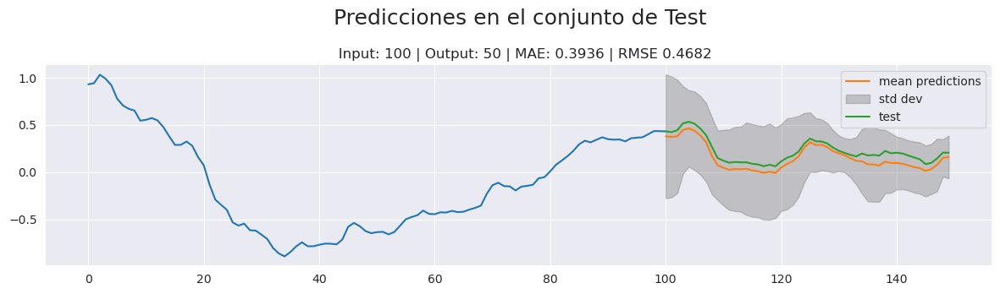

In [15]:
INPUT_SIZE = 100
OUTPUT_SIZE = 50

plt.figure(figsize=(12,3.5))
plt.suptitle('       Predicciones en el conjunto de Test',fontsize=18)
plt.title(f"   Input: {str(INPUT_SIZE)} | Output: {str(OUTPUT_SIZE)} | MAE: {str(mae.round(4))} | RMSE {str(rmse.round(4))}")
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(stages_mean[:INPUT_SIZE+1].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(media), label="mean predictions")
plt.fill_between(range(INPUT_SIZE,STAGES_LENGTH), media - std_dev, media + std_dev, color='grey', alpha=0.4, label='std dev')
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(stages_mean[INPUT_SIZE:STAGES_LENGTH].values), label="test")
sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

plt.savefig("preds/pred50_cross_val.png")

## Input = 20, Output = 1

In [ ]:
#preds_20_1 = pd.DataFrame(columns=["input_size","output_size","mae","rmse","deep_layers","lstm_units","learning_rate","batch_size","max_epochs"])
preds_20_1 = pd.read_csv("datasets/predictions_input20_output1.csv")

In [ ]:
preds_20_1.to_csv("datasets/predictions_input20_output1.csv",index=False)

In [ ]:
mae=1
while mae>0.06:
    X_train, y_train = generate_moving_windows(train_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    X_val, y_val = generate_moving_windows(val_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    X_test, y_test = generate_moving_windows(test_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    history, model = train_model(X_train, y_train, X_val, y_val, output_size=OUTPUT_SIZE, deep_layers=0, lstm_units=160, lr=0.01, bs=1, epochs=300)
    results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
    mae, rmse = get_metrics(y_test.flatten(), results.flatten())

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 11:48:42.357908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 11:48:42.364140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 11:48:42.368348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.06971781327097136
MSE:  0.013062481316039704
RMSE:  0.11429121276826011
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 12:08:12.032703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 12:08:12.036611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 12:08:12.039649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.0607227203639911
MSE:  0.01306993239094593
RMSE:  0.11432380500554523
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 12:24:23.247536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 12:24:23.249582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 12:24:23.251387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.06869005975599356
MSE:  0.012675877052365935
RMSE:  0.11258719755090245
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 12:44:48.572665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 12:44:48.575989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 12:44:48.578122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.06640356816762613
MSE:  0.0126973291140583
RMSE:  0.11268242593261071
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 13:08:08.070446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 13:08:08.073007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 13:08:08.075107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.06624218536038133
MSE:  0.013182147812246792
RMSE:  0.11481353496973601
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 13:31:22.069375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 13:31:22.073844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 13:31:22.076584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.06025223351772751
MSE:  0.013681086331217932
RMSE:  0.11696617601348662
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 13:49:12.326647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 13:49:12.329318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 13:49:12.330969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.07564929018876482
MSE:  0.015775598877292754
RMSE:  0.12560095094103688
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 14:09:33.120012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 14:09:33.123334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 14:09:33.125852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.07232511445005918
MSE:  0.013476422597897109
RMSE:  0.11608799506364605
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 14:23:42.174835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 14:23:42.178268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 14:23:42.181228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.060104327551635986
MSE:  0.010708967439030962
RMSE:  0.10348414100252736
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 14:40:59.065291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 14:40:59.068287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 14:40:59.070333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.06987673305101799
MSE:  0.014609776878296758
RMSE:  0.12087090997546415
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 14:53:37.279668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 14:53:37.282268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 14:53:37.284021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.06719899909913594
MSE:  0.012410571181254005
RMSE:  0.11140274314959217
Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-08 15:11:47.508966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 15:11:47.512167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 15:11:47.514038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.059495548015284935
MSE:  0.012481374431679527
RMSE:  0.11172007174934828


In [69]:
best_model_20_1 = load_model("models/pred1.h5")

2023-06-10 17:34:21.286199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 17:34:21.292657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 17:34:21.296906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [ ]:
preds_20_1 = tuning(preds_20_1, train_df, val_df, test_df, input_size=20, output_size=1, layers=[0], lstm_units=[40,60,80,100,120,160], lr=[0.05, 0.01, 0.005, 0.001], bs=[1,2,4], epochs=300)
# HECHO

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 21:38:50.085520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 21:38:50.090125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 21:38:50.092785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 21:50:29.598693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 21:50:29.603674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 21:50:29.607593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 21:54:38.560507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 21:54:38.565812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 21:54:38.569383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 21:59:30.268113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 21:59:30.273616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 21:59:30.275992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 22:11:45.511533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 22:11:45.514971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 22:11:45.517967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 22:20:02.482598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 22:20:02.486164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 22:20:02.489343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 22:23:05.267309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 22:23:05.273121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 22:23:05.277846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 22:35:04.141722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 22:35:04.146200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 22:35:04.148465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 22:41:24.218806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 22:41:24.222348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 22:41:24.225557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 22:45:19.555997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 22:45:19.560892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 22:45:19.565899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 22:57:31.563868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 22:57:31.567191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 22:57:31.571099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 23:03:37.091093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 23:03:37.094749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 23:03:37.097668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 23:07:03.038455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 23:07:03.041505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 23:07:03.045124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 23:14:14.086768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 23:14:14.089237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 23:14:14.091063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 23:19:13.016203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 23:19:13.021603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 23:19:13.024075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 23:23:46.807962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 23:23:46.812412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 23:23:46.817942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 23:37:00.899651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 23:37:00.902906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 23:37:00.906375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 23:44:03.468477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 23:44:03.471882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 23:44:03.474831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 23:47:41.621780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 23:47:41.625115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 23:47:41.628444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:00:20.296551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:00:20.302787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:00:20.306705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:07:56.820006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:07:56.823960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:07:56.826405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:12:01.043067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:12:01.045952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:12:01.048753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:22:38.409954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:22:38.412847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:22:38.415237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:30:02.824036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:30:02.826956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:30:02.829641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:33:36.204902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:33:36.208077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:33:36.212313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:41:48.359674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:41:48.362829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:41:48.366413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:47:33.876310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:47:33.879557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:47:33.882728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 00:51:40.263031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 00:51:40.266921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 00:51:40.271707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 01:05:42.742273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 01:05:42.746447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 01:05:42.750830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 01:14:43.741718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 01:14:43.745844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 01:14:43.748341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 01:18:52.817883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 01:18:52.823625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 01:18:52.827585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 01:31:14.218692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 01:31:14.223587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 01:31:14.225899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 01:39:39.505875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 01:39:39.509462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 01:39:39.512363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 01:44:18.303488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 01:44:18.306841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 01:44:18.309885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 01:54:33.258452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 01:54:33.262345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 01:54:33.265167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 02:01:45.581331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 02:01:45.585726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 02:01:45.588018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 02:05:59.601029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 02:05:59.604527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 02:05:59.607197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 02:23:34.187842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 02:23:34.190131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 02:23:34.191965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 02:35:31.117661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 02:35:31.120210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 02:35:31.122305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 02:38:50.938401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 02:38:50.942227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 02:38:50.945012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 02:51:14.190043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 02:51:14.195708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 02:51:14.200182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 03:00:21.567086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 03:00:21.570745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 03:00:21.574640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 03:04:57.733913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 03:04:57.737459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 03:04:57.741107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 03:16:58.580909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 03:16:58.584169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 03:16:58.587624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 03:25:27.046063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 03:25:27.049885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 03:25:27.052075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 03:30:01.764611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 03:30:01.768100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 03:30:01.772346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 03:44:37.492610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 03:44:37.496260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 03:44:37.498519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 03:54:08.703743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 03:54:08.708171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 03:54:08.713794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 03:58:44.906179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 03:58:44.909062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 03:58:44.911823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 04:07:48.005520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 04:07:48.009796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 04:07:48.013394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 04:18:50.274500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 04:18:50.279152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 04:18:50.284263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 04:22:28.522605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 04:22:28.525727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 04:22:28.530472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 04:37:42.426433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 04:37:42.429140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 04:37:42.431746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 04:49:26.751348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 04:49:26.754535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 04:49:26.756846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 04:54:34.401710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 04:54:34.405472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 04:54:34.408295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 05:10:29.501938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 05:10:29.505489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 05:10:29.507349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 05:20:32.836640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 05:20:32.839809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 05:20:32.843705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 05:25:06.462997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 05:25:06.466906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 05:25:06.469582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 05:38:13.895132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 05:38:13.899628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 05:38:13.901900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 05:48:23.606005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 05:48:23.610385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 05:48:23.615003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 05:55:11.659492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 05:55:11.664210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 05:55:11.668253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 06:22:55.141994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 06:22:55.144950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 06:22:55.148945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 06:48:48.475254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 06:48:48.477814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 06:48:48.480197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 06:57:17.100911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 06:57:17.104664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 06:57:17.107190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 07:19:18.790866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 07:19:18.793433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 07:19:18.795293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 07:35:48.870300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 07:35:48.874098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 07:35:48.877683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 07:47:34.414694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 07:47:34.417636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 07:47:34.420653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 08:10:17.430736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 08:10:17.435485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 08:10:17.439564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 08:26:16.226020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 08:26:16.230343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 08:26:16.233485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 08:34:01.044728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 08:34:01.049355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 08:34:01.052011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 08:52:45.096679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 08:52:45.101765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 08:52:45.103927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-07 09:06:33.122552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-07 09:06:33.125895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-07 09:06:33.129817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [ ]:
preds_20_1 = tuning(preds_20_1, train_df, val_df, test_df, input_size=20, output_size=1, layers=[1], lstm_units=[40,60,80,100,120,160], lr=[0.05, 0.01, 0.005, 0.001], bs=[1,2,4], epochs=300)
# HECHO

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:31:53.716288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:31:53.721523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:31:53.727686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:40:35.852390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:40:35.855582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:40:35.859877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:45:09.802319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:45:09.808084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:45:09.812446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:47:11.036841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:47:11.042209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:47:11.046078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:59:33.772011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:59:33.775340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:59:33.778839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:06:57.741529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:06:57.745886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:06:57.750546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:09:41.581657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:09:41.584935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:09:41.587699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:19:43.536692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:19:43.540626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:19:43.542811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:27:19.926173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:27:19.930228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:27:19.932742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:30:57.429916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:30:57.432307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:30:57.434481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:41:34.088402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:41:34.093544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:41:34.097626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:48:21.257118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:48:21.262155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:48:21.264850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:51:06.404335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:51:06.406708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:51:06.408617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:57:45.044953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:57:45.048263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:57:45.050667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:02:00.807038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:02:00.811202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:02:00.813636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:06:46.180374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:06:46.184504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:06:46.188954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:17:31.076762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:17:31.081575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:17:31.086033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:25:05.078265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:25:05.081321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:25:05.083569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:27:54.621463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:27:54.624436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:27:54.627294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:41:09.009634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:41:09.015358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:41:09.017831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:48:24.662143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:48:24.663890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:48:24.665702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:52:40.792031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:52:40.794860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:52:40.797737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:04:35.613810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:04:35.617650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:04:35.620610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:11:17.213966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:11:17.221159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:11:17.224174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:14:43.890013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:14:43.892861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:14:43.894804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:22:02.514828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:22:02.517312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:22:02.519097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:27:34.070507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:27:34.074766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:27:34.078320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:31:52.791444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:31:52.795232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:31:52.798536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:43:41.659089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:43:41.662733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:43:41.665495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:49:39.980941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:49:39.983955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:49:39.986543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:53:14.628570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:53:14.632470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:53:14.635214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:04:46.331796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:04:46.335981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:04:46.338024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:11:59.545576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:11:59.548350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:11:59.550555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:16:12.727365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:16:12.731314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:16:12.736148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:26:48.566086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:26:48.570950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:26:48.575550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:34:05.368990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:34:05.371319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:34:05.373141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:37:14.508678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:37:14.512595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:37:14.515667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:55:21.486865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:55:21.489587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:55:21.491989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:00:27.803810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:00:27.806426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:00:27.808576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:03:15.959491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:03:15.964784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:03:15.969209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:11:44.764170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:11:44.768142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:11:44.772992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:22:08.795478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:22:08.800509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:22:08.803468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:25:44.232384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:25:44.236027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:25:44.238448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:40:48.124278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:40:48.127719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:40:48.130720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:50:40.532967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:50:40.536077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:50:40.538413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:54:43.219375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:54:43.222389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:54:43.225945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:06:02.650296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:06:02.653853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:06:02.656109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:12:52.874410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:12:52.877558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:12:52.880082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:17:20.047523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:17:20.053475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:17:20.056281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:36:19.910139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:36:19.914558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:36:19.917119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:47:44.160506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:47:44.162946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:47:44.164954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:52:25.175791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:52:25.178677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:52:25.180652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:07:18.285120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:07:18.291031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:07:18.293880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:15:54.026557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:15:54.030493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:15:54.033461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:21:04.016246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:21:04.021101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:21:04.025029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:36:17.016394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:36:17.019761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:36:17.022253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:47:27.195987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:47:27.198948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:47:27.202648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:51:28.831442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:51:28.833284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:51:28.834742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:00:53.395014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:00:53.396599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:00:53.397853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:08:09.846624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:08:09.850290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:08:09.853080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:12:22.390049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:12:22.395293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:12:22.398361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:41:39.166356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:41:39.170502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:41:39.174364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:59:36.235946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:59:36.240535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:59:36.245725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 20:10:43.479853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 20:10:43.484024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 20:10:43.486656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [ ]:
preds_20_1 = tuning(preds_20_1, train_df, val_df, test_df, input_size=20, output_size=1, layers=[2], lstm_units=[40,60,80,100,120,160], lr=[0.05, 0.01, 0.005, 0.001], bs=[1,2,4], epochs=300)
# HECHO

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:31:53.716288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:31:53.721523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:31:53.727686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:40:35.852390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:40:35.855582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:40:35.859877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:45:09.802319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:45:09.808084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:45:09.812446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:47:11.036841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:47:11.042209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:47:11.046078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 11:59:33.772011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 11:59:33.775340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 11:59:33.778839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:06:57.741529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:06:57.745886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:06:57.750546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:09:41.581657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:09:41.584935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:09:41.587699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:19:43.536692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:19:43.540626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:19:43.542811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:27:19.926173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:27:19.930228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:27:19.932742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:30:57.429916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:30:57.432307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:30:57.434481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:41:34.088402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:41:34.093544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:41:34.097626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:48:21.257118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:48:21.262155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:48:21.264850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:51:06.404335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:51:06.406708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:51:06.408617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 12:57:45.044953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 12:57:45.048263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 12:57:45.050667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:02:00.807038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:02:00.811202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:02:00.813636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:06:46.180374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:06:46.184504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:06:46.188954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:17:31.076762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:17:31.081575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:17:31.086033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:25:05.078265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:25:05.081321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:25:05.083569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:27:54.621463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:27:54.624436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:27:54.627294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:41:09.009634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:41:09.015358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:41:09.017831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:48:24.662143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:48:24.663890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:48:24.665702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 13:52:40.792031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 13:52:40.794860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 13:52:40.797737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:04:35.613810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:04:35.617650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:04:35.620610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:11:17.213966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:11:17.221159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:11:17.224174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:14:43.890013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:14:43.892861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:14:43.894804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:22:02.514828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:22:02.517312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:22:02.519097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:27:34.070507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:27:34.074766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:27:34.078320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:31:52.791444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:31:52.795232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:31:52.798536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:43:41.659089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:43:41.662733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:43:41.665495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:49:39.980941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:49:39.983955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:49:39.986543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 14:53:14.628570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 14:53:14.632470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 14:53:14.635214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:04:46.331796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:04:46.335981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:04:46.338024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:11:59.545576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:11:59.548350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:11:59.550555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:16:12.727365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:16:12.731314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:16:12.736148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:26:48.566086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:26:48.570950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:26:48.575550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:34:05.368990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:34:05.371319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:34:05.373141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:37:14.508678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:37:14.512595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:37:14.515667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 15:55:21.486865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 15:55:21.489587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 15:55:21.491989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:00:27.803810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:00:27.806426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:00:27.808576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:03:15.959491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:03:15.964784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:03:15.969209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:11:44.764170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:11:44.768142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:11:44.772992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:22:08.795478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:22:08.800509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:22:08.803468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:25:44.232384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:25:44.236027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:25:44.238448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:40:48.124278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:40:48.127719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:40:48.130720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:50:40.532967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:50:40.536077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:50:40.538413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 16:54:43.219375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 16:54:43.222389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 16:54:43.225945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:06:02.650296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:06:02.653853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:06:02.656109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:12:52.874410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:12:52.877558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:12:52.880082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:17:20.047523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:17:20.053475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:17:20.056281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:36:19.910139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:36:19.914558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:36:19.917119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:47:44.160506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:47:44.162946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:47:44.164954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 17:52:25.175791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 17:52:25.178677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 17:52:25.180652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:07:18.285120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:07:18.291031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:07:18.293880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:15:54.026557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:15:54.030493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:15:54.033461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:21:04.016246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:21:04.021101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:21:04.025029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:36:17.016394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:36:17.019761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:36:17.022253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:47:27.195987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:47:27.198948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:47:27.202648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 18:51:28.831442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 18:51:28.833284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 18:51:28.834742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:00:53.395014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:00:53.396599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:00:53.397853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:08:09.846624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:08:09.850290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:08:09.853080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:12:22.390049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:12:22.395293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:12:22.398361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:41:39.166356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:41:39.170502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:41:39.174364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 19:59:36.235946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 19:59:36.240535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 19:59:36.245725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-06 20:10:43.479853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 20:10:43.484024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 20:10:43.486656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [ ]:
results_df = tuning(results_df, X_train, y_train, X_val, y_val, 50, [0,1], [40,50,60,70,80,100,120,150],
        [0.02,0.04,0.06,0.08,0.002,0.004,0.006,0.008], [1,2,3,4], 300)


2023-05-29 18:44:08.000028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-29 18:44:08.002882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-29 18:44:08.005194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [73]:
X_test, y_test = generate_moving_windows(test_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
results = best_model_20_1.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
mae, rmse = get_metrics(y_test.flatten(), results.flatten())

Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)
MAE:  0.059495548015284935
MSE:  0.012481374431679527
RMSE:  0.11172007174934828


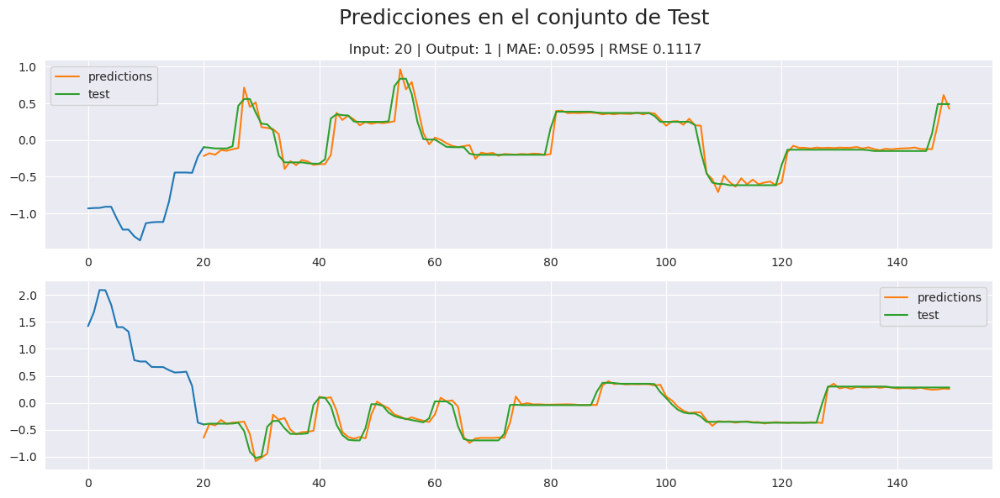

In [75]:
INPUT_SIZE = 20
OUTPUT_SIZE = 1

plt.figure(figsize=(12,6))
plt.suptitle('       Predicciones en el conjunto de Test',fontsize=18)
plt.subplot(2, 1, 1)

plt.title(f"   Input: {str(INPUT_SIZE)} | Output: {str(OUTPUT_SIZE)} | MAE: {str(mae.round(4))} | RMSE {str(rmse.round(4))}")
res = results[1].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[:INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results[:STAGES_LENGTH-INPUT_SIZE].reshape(STAGES_LENGTH-INPUT_SIZE)), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[INPUT_SIZE:STAGES_LENGTH]["DAC"].values), label="test")
sns.set_style("darkgrid")

sns.despine()

plt.subplot(2, 1, 2)

res = results[0].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[STAGES_LENGTH:STAGES_LENGTH+INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results[STAGES_LENGTH-INPUT_SIZE:2*STAGES_LENGTH-2*INPUT_SIZE].reshape(STAGES_LENGTH-INPUT_SIZE)), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[STAGES_LENGTH+INPUT_SIZE:2*STAGES_LENGTH]["DAC"].values), label="test")

sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

#plt.savefig("mov_win/inp20out1layers0units1600lr001bs1epochs300.png")

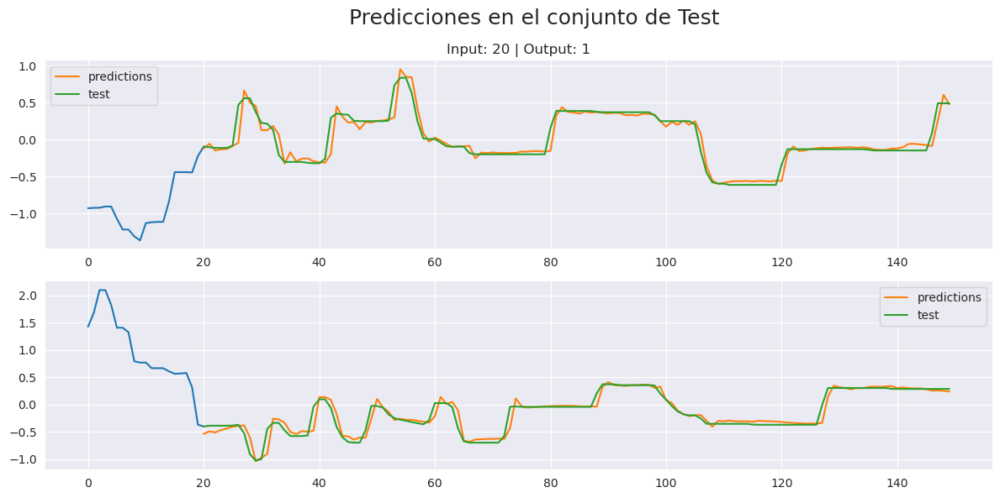

In [ ]:
INPUT_SIZE = 20
OUTPUT_SIZE = 1

plt.figure(figsize=(12,6))
plt.suptitle('       Predicciones en el conjunto de Test',fontsize=18)
plt.subplot(2, 1, 1)

plt.title(f"   Input: {str(INPUT_SIZE)} | Output: {str(OUTPUT_SIZE)} | MAE: {str(mae.round(4))} | RMSE {str(rmse.round(4))}")
res = results[1].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[:INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results[:STAGES_LENGTH-INPUT_SIZE].reshape(STAGES_LENGTH-INPUT_SIZE)), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[INPUT_SIZE:STAGES_LENGTH]["DAC"].values), label="test")
sns.set_style("darkgrid")

sns.despine()

plt.subplot(2, 1, 2)

res = results[0].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[STAGES_LENGTH:STAGES_LENGTH+INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results[STAGES_LENGTH-INPUT_SIZE:2*STAGES_LENGTH-2*INPUT_SIZE].reshape(STAGES_LENGTH-INPUT_SIZE)), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[STAGES_LENGTH+INPUT_SIZE:2*STAGES_LENGTH]["DAC"].values), label="test")

sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

#plt.savefig("mov_win/inp20out1layers1units80lr0001bs2epochs300.png")

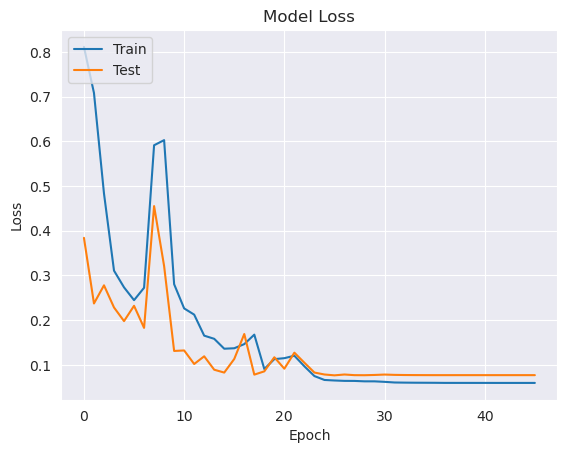

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

## Input = 20, Output = 5

In [ ]:
#preds_20_5 = pd.DataFrame(columns=["input_size","output_size","mae","rmse","deep_layers","lstm_units","learning_rate","batch_size","max_epochs"])
preds_20_5 = pd.read_csv("datasets/predictions_input20_output5.csv")

In [ ]:
preds_20_5.to_csv("datasets/predictions_input20_output5.csv",index=False)

In [ ]:
mae=1
while mae>0.162:
    X_train, y_train = generate_moving_windows(train_df, "DAC",150,20,5)
    X_val, y_val = generate_moving_windows(val_df, "DAC",150,20,5)
    X_test, y_test = generate_moving_windows(test_df, "DAC",150,20,5)
    history, model = train_model(X_train, y_train, X_val, y_val, output_size=5, deep_layers=1, lstm_units=160, lr=0.01, bs=4, epochs=300)
    results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
    mae, rmse = get_metrics(y_test.flatten(), results.flatten())

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:19:37.977663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:19:37.980139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:19:37.982785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1697456965394795
MSE:  0.058771740035549865
RMSE:  0.24242883499194123
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:20:58.978141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:20:58.980490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:20:58.983767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17786260599839152
MSE:  0.061639502830783524
RMSE:  0.24827304088600421
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:22:39.798883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:22:39.802265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:22:39.804586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16886988567505423
MSE:  0.06450728404301583
RMSE:  0.25398284202484195
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:24:30.003366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:24:30.005477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:24:30.008404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1793332611009738
MSE:  0.06672679086808975
RMSE:  0.2583152935234183
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:26:43.091535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:26:43.094239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:26:43.096035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17826703661435805
MSE:  0.06448649814424273
RMSE:  0.2539419188402
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:28:34.119042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:28:34.121823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:28:34.123480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17273688555569497
MSE:  0.06618554318568153
RMSE:  0.25726551106917056
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:30:49.516628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:30:49.520677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:30:49.523522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17886056805445527
MSE:  0.06586882674392923
RMSE:  0.2566492289953921
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:33:07.858281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:33:07.860990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:33:07.863394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17816277775328349
MSE:  0.061366644960366826
RMSE:  0.24772291973163652
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:35:00.379797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:35:00.384753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:35:00.388296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17480365056280828
MSE:  0.05609819668848421
RMSE:  0.2368505788223542
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:37:53.179550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:37:53.183300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:37:53.185350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17707268994657477
MSE:  0.0616452224447281
RMSE:  0.2482845594166663
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:39:57.029551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:39:57.033302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:39:57.035457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17378554275064284
MSE:  0.0628688676910176
RMSE:  0.2507366500753681
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:42:20.048899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:42:20.051604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:42:20.054484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1758021704797905
MSE:  0.058308452944955104
RMSE:  0.2414714329790485
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:44:46.881799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:44:46.884544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:44:46.886699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.20054582345978833
MSE:  0.074906382122824
RMSE:  0.27369030330434435
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:48:22.270309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:48:22.272998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:48:22.275088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17755258042090916
MSE:  0.06236874075165401
RMSE:  0.24973734352646185
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:50:47.208693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:50:47.210982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:50:47.213885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.22325305500273865
MSE:  0.08962698252470935
RMSE:  0.29937765869334565
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:52:25.015958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:52:25.018319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:52:25.020460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.177443200004709
MSE:  0.06582076336359961
RMSE:  0.25655557558470565
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:54:25.300216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:54:25.302785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:54:25.305162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18003080413607592
MSE:  0.060983450991045476
RMSE:  0.24694827594264648
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 20:57:58.726264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 20:57:58.728777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 20:57:58.731684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17555667427912341
MSE:  0.06146569838424341
RMSE:  0.24792276697440155
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:00:07.194029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:00:07.197206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:00:07.198814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1790626920948942
MSE:  0.06834147234002816
RMSE:  0.26142201961584677
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:02:04.181374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:02:04.185417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:02:04.187512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17212896638117497
MSE:  0.0563086916894135
RMSE:  0.23729452519898875
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:04:31.108728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:04:31.110831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:04:31.112758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17853025074609122
MSE:  0.06240786545729002
RMSE:  0.2498156629542872
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:06:39.607117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:06:39.609516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:06:39.611600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18975453710529466
MSE:  0.06433209552910589
RMSE:  0.2536377249722641
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:09:14.808293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:09:14.810956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:09:14.813514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17630471724058225
MSE:  0.06460805028877185
RMSE:  0.254181136768195
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:11:44.072136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:11:44.074043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:11:44.075583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1772857514606616
MSE:  0.061355435894935445
RMSE:  0.24770029449908906
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:13:56.452162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:13:56.455484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:13:56.457330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17842949235697042
MSE:  0.06572916168721306
RMSE:  0.2563769913373918
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:16:08.748511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:16:08.750578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:16:08.752205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1849215580610287
MSE:  0.06856246081040561
RMSE:  0.2618443446217726
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:18:45.103830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:18:45.106572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:18:45.108965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1726337242951781
MSE:  0.06021818961752595
RMSE:  0.2453939478013383
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:21:20.437908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:21:20.440213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:21:20.442136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17044360306268538
MSE:  0.06169236070535872
RMSE:  0.24837946917037793
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:23:25.057447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:23:25.061543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:23:25.063446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18750140167170468
MSE:  0.06031660103154024
RMSE:  0.24559438314330448
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:25:25.691920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:25:25.694288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:25:25.696606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1801392026227808
MSE:  0.0626117560955821
RMSE:  0.2502234123649945
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:27:26.382720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:27:26.385693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:27:26.387369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16903609169469225
MSE:  0.05892936750413049
RMSE:  0.2427537177967219
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:29:35.009147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:29:35.011175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:29:35.013094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17165255441823352
MSE:  0.05614931908295016
RMSE:  0.23695847544021328
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:32:27.355285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:32:27.357922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:32:27.360563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1692346348325239
MSE:  0.06720406234362884
RMSE:  0.2592374632332851
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:34:29.310327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:34:29.313142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:34:29.315412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16549714598606088
MSE:  0.05446359851485858
RMSE:  0.23337437416061468
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:37:06.011506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:37:06.013820: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:37:06.016218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18106963708713594
MSE:  0.06054549410317482
RMSE:  0.24605994006171508
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:40:35.065882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:40:35.069116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:40:35.071538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17346234454450984
MSE:  0.05655474570441601
RMSE:  0.23781241705263417
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:42:11.572047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:42:11.575022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:42:11.577261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16576973440026033
MSE:  0.05498835151584536
RMSE:  0.23449595202443338
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:44:31.557307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:44:31.559885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:44:31.562423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17004080172900804
MSE:  0.060418260904846
RMSE:  0.24580126302532704
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:47:25.650998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:47:25.653463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:47:25.656748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18785656240038548
MSE:  0.07076743734876013
RMSE:  0.2660214979071431
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:50:06.328676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:50:06.331652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:50:06.336053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1816974766020014
MSE:  0.060536474562128816
RMSE:  0.2460416114443425
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:52:20.073108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:52:20.075721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:52:20.078416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.170526071452715
MSE:  0.06053208907040053
RMSE:  0.2460326991893568
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 21:53:57.078916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 21:53:57.081415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 21:53:57.083377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17079770701902877
MSE:  0.055261226853035805
RMSE:  0.2350770657742601
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:00:23.078918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:00:23.082284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:00:23.084218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17875317151014208
MSE:  0.062350115345354284
RMSE:  0.24970005075160534
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:02:47.983504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:02:47.986146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:02:47.989652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16492141757128612
MSE:  0.05742982586379467
RMSE:  0.23964520830551708
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:04:40.148216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:04:40.151421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:04:40.154691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17606304662437008
MSE:  0.058914898076987916
RMSE:  0.24272391327800383
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:07:42.493105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:07:42.496918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:07:42.498822: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18239324880353294
MSE:  0.0650085164124434
RMSE:  0.25496767719152835
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:09:47.266171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:09:47.268682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:09:47.271190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1744116921315143
MSE:  0.06405013714443766
RMSE:  0.2530812856464058
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:11:48.586864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:11:48.589795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:11:48.592552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17854807684821972
MSE:  0.06397107288012147
RMSE:  0.25292503411114026
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:14:02.059973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:14:02.061876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:14:02.063400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18030242258665438
MSE:  0.06400716983348083
RMSE:  0.25299638304426575
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:15:40.128786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:15:40.132005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:15:40.134966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17317906622425766
MSE:  0.06658243694979228
RMSE:  0.2580357280490287
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:18:00.349249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:18:00.351516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:18:00.353044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.22842111329570106
MSE:  0.08503709571118682
RMSE:  0.2916112064225016
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:21:42.445835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:21:42.448641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:21:42.450573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17613273922382017
MSE:  0.057605008879881715
RMSE:  0.2400104349395703
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:23:46.844759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:23:46.846750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:23:46.848923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16426911144106734
MSE:  0.05910701524338392
RMSE:  0.24311934362239448
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:25:59.060807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:25:59.063403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:25:59.065932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.19724989526936051
MSE:  0.07448079453162998
RMSE:  0.2729116973155053
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:28:54.935789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:28:54.938119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:28:54.940991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17675712981132324
MSE:  0.06597801621772861
RMSE:  0.2568618621316302
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:31:11.464660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:31:11.466478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:31:11.468519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17289444345408808
MSE:  0.06277293653642951
RMSE:  0.25054527841575763
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:33:47.406035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:33:47.408711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:33:47.413241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.24919561036196153
MSE:  0.10886314493863526
RMSE:  0.3299441542725606
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:37:54.526058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:37:54.528950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:37:54.531120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18203128234687097
MSE:  0.0675301382182239
RMSE:  0.2598656156905409
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:40:00.471666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:40:00.474269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:40:00.477008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16975265540616763
MSE:  0.06212597599197614
RMSE:  0.2492508294709892
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:42:16.843851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:42:16.845847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:42:16.847409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18854946846729248
MSE:  0.06356747097495022
RMSE:  0.25212590302257765
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:46:26.926488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:46:26.930128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:46:26.932269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18230682471882306
MSE:  0.06482583534591496
RMSE:  0.2546091815821161
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:48:46.991611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:48:46.994538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:48:46.996844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.22482117091106765
MSE:  0.10745129323533513
RMSE:  0.3277976406799401
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:50:38.850248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:50:38.853919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:50:38.855730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17110672234708243
MSE:  0.06255284997403832
RMSE:  0.25010567761256103
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:52:56.692928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:52:56.695819: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:52:56.698191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1738032104113551
MSE:  0.06434307540464108
RMSE:  0.2536593688485428
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:54:46.700011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:54:46.702470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:54:46.704640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18725255787538286
MSE:  0.0667638017672292
RMSE:  0.2583869225932868
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 22:56:58.408835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 22:56:58.411658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 22:56:58.414224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1724998107675227
MSE:  0.060272769536176225
RMSE:  0.24550513138461327
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:00:14.017673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:00:14.020128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:00:14.023280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17521965726044264
MSE:  0.05703547162832916
RMSE:  0.23882100332326126
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:02:04.555628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:02:04.557884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:02:04.561208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17416122805363118
MSE:  0.0658325023942471
RMSE:  0.25657845270842033
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:04:24.830537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:04:24.832940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:04:24.835078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.19303186305958497
MSE:  0.07877422406201051
RMSE:  0.28066746170871054
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:07:05.936857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:07:05.940017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:07:05.942831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16871436550943114
MSE:  0.06071659570670636
RMSE:  0.24640737754114903
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:09:38.464253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:09:38.466437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:09:38.468204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17578643254208254
MSE:  0.05997448915269847
RMSE:  0.24489689494295036
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:11:49.125915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:11:49.128355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:11:49.130233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.180835477522856
MSE:  0.06387572710976577
RMSE:  0.25273647760021856
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:14:10.656785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:14:10.658883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:14:10.660574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1751233346520384
MSE:  0.07223390256380118
RMSE:  0.26876365558572307
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:16:34.637670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:16:34.639742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:16:34.643029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17946429185602608
MSE:  0.060828200301652736
RMSE:  0.2466337371521843
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:18:15.377489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:18:15.381078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:18:15.383269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17558262680342399
MSE:  0.05652607424939757
RMSE:  0.23775212774946425
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:20:41.219701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:20:41.222350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:20:41.224740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1800965703607642
MSE:  0.06007714375475541
RMSE:  0.2451063927251907
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:22:51.783069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:22:51.785923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:22:51.787677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18500603796682935
MSE:  0.0680175748852698
RMSE:  0.2608017923352326
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:24:47.920494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:24:47.924416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:24:47.926691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17824780223565972
MSE:  0.05550212252552156
RMSE:  0.23558888455426236
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:30:00.533275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:30:00.535460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:30:00.537110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1847331438104313
MSE:  0.06348915274709284
RMSE:  0.25197053944279446
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:32:08.633079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:32:08.635183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:32:08.636881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1718630725465249
MSE:  0.06330611069780277
RMSE:  0.2516070561367522
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:34:27.594539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:34:27.597571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:34:27.599726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18862643890217237
MSE:  0.06551521029083696
RMSE:  0.25595939187854966
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:36:44.024912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:36:44.027545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:36:44.029815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16953323035833112
MSE:  0.056805564200787376
RMSE:  0.23833917890432402
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:40:19.731602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:40:19.733533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:40:19.735279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17175658032364893
MSE:  0.05809534485817042
RMSE:  0.24102975927916126
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:42:23.816045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:42:23.818538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:42:23.820955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17540196858345644
MSE:  0.061024980822490194
RMSE:  0.2470323477249289
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:44:32.921510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:44:32.924839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:44:32.926979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18334246904696042
MSE:  0.061700680839691185
RMSE:  0.24839621744239823
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:47:00.926878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:47:00.930414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:47:00.933264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17429299513300922
MSE:  0.0645600901265775
RMSE:  0.25408677676450914
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:49:00.624622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:49:00.626816: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:49:00.629457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18053979215142874
MSE:  0.06908914696630586
RMSE:  0.262848144308279
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:51:13.689208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:51:13.691832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:51:13.694010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1721251902262684
MSE:  0.06397664904528837
RMSE:  0.25293605722650214
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:53:34.076690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:53:34.078890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:53:34.081597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17241590194424392
MSE:  0.057810338135915365
RMSE:  0.24043780513038163
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:57:37.239183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:57:37.242608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:57:37.245010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17566319274104397
MSE:  0.062680197274486
RMSE:  0.25036013515431327
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 23:59:57.845441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 23:59:57.847572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 23:59:57.849941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18160551983941053
MSE:  0.06874265570520406
RMSE:  0.2621882066478278
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:02:34.781239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:02:34.783519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:02:34.785102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17831319585347982
MSE:  0.0597610916540601
RMSE:  0.24446081823895643
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:04:58.609541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:04:58.612085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:04:58.614402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17920115066890135
MSE:  0.06371956555732326
RMSE:  0.2524273470868861
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:07:26.407920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:07:26.410305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:07:26.413356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17511006201246898
MSE:  0.06274408499966883
RMSE:  0.25048769430786183
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:09:45.502005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:09:45.504043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:09:45.505632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17631688808724563
MSE:  0.06340663565640337
RMSE:  0.2518067426746221
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:12:50.946849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:12:50.949304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:12:50.951075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.2723753480912533
MSE:  0.10812406012434461
RMSE:  0.32882223179758485
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:14:36.577403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:14:36.580835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:14:36.583048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.182239221873282
MSE:  0.06646401101730802
RMSE:  0.25780615007657987
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:16:30.767022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:16:30.770514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:16:30.772899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17486254874206827
MSE:  0.06269010026401595
RMSE:  0.25037991186198616
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:18:26.735549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:18:26.737584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:18:26.739369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.2124831022569487
MSE:  0.07960319917870147
RMSE:  0.28214038913048495
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:20:24.458191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:20:24.460472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:20:24.462145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.2490236062676196
MSE:  0.10999056425773768
RMSE:  0.3316482538137924
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:22:31.262847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:22:31.265784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:22:31.268017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1772959849576907
MSE:  0.06508008829454957
RMSE:  0.25510799339603135
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:24:53.423009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:24:53.425063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:24:53.427057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.20629809578841618
MSE:  0.07563451271009192
RMSE:  0.2750172952926632
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:26:53.773672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:26:53.776732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:26:53.779426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16713148934321984
MSE:  0.05607166199304236
RMSE:  0.2367945565105802
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:28:39.891676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:28:39.893809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:28:39.896177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.19831921761800614
MSE:  0.06663756749856385
RMSE:  0.2581425333000431
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:32:10.169655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:32:10.173597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:32:10.176327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17132655510712608
MSE:  0.06308756248676381
RMSE:  0.2511723760423582
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:34:17.363246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:34:17.365883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:34:17.367413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16732929455602985
MSE:  0.05970250937110454
RMSE:  0.24434096948957318
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:36:20.768594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:36:20.772256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:36:20.774667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16472090761332472
MSE:  0.0599773606772408
RMSE:  0.24490275759419453
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:39:04.293881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:39:04.295985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:39:04.298496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18643467951287856
MSE:  0.06965073470797417
RMSE:  0.2639142563560638
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:41:27.101381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:41:27.104034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:41:27.107071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.19128947890789647
MSE:  0.0641913571399001
RMSE:  0.253360133288369
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:43:18.159615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:43:18.164445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:43:18.168525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1767054919155191
MSE:  0.0611435372007258
RMSE:  0.24727219253431187
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:46:18.273805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:46:18.276586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:46:18.278872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17679567141216077
MSE:  0.0658285031096504
RMSE:  0.25657065909735355
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:48:24.579988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:48:24.583432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:48:24.585745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18045207967786767
MSE:  0.061510915012591025
RMSE:  0.24801394116579623
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:50:44.426993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:50:44.429907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:50:44.432230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17969557649034767
MSE:  0.07581928282972003
RMSE:  0.27535301492760167
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:53:21.566431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:53:21.569253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:53:21.571545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17132943091966962
MSE:  0.0632983724524253
RMSE:  0.2515916780269675
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:55:14.753072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:55:14.755298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:55:14.757149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16896937775418558
MSE:  0.05459685826844961
RMSE:  0.23365970612934017
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 00:59:04.835522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 00:59:04.837848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 00:59:04.839373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.188519057138755
MSE:  0.07320726052319006
RMSE:  0.2705684026696208
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:01:20.878884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:01:20.882110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:01:20.884520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17971464812245289
MSE:  0.06610181576094828
RMSE:  0.2571027338651775
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:03:46.817526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:03:46.819598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:03:46.821352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.19422272531172238
MSE:  0.06810435867687667
RMSE:  0.26096811812341497
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:06:21.721451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:06:21.724031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:06:21.726828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17480643595462667
MSE:  0.06304941587006381
RMSE:  0.25109642743389204
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:08:49.606382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:08:49.609195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:08:49.611806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17269257743366762
MSE:  0.05748264333003723
RMSE:  0.23975538227542928
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:10:43.926635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:10:43.929110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:10:43.930586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17399991667878828
MSE:  0.06103007194239717
RMSE:  0.247042652071251
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:12:45.220725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:12:45.223300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:12:45.224938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16799766870398197
MSE:  0.06199553153701402
RMSE:  0.2489890189084933
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:15:14.044725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:15:14.047405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:15:14.049572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1776716194921886
MSE:  0.06575698090495147
RMSE:  0.25643124011116797
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:17:08.450115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:17:08.452298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:17:08.454218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1739049806896489
MSE:  0.05929168919165653
RMSE:  0.24349884844010358
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:19:48.948994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:19:48.951882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:19:48.954098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.20054772125270348
MSE:  0.08103093729866274
RMSE:  0.28465933551995576
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:24:39.121375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:24:39.123633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:24:39.126285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17711126128421534
MSE:  0.05538205606410429
RMSE:  0.2353339245924911
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:27:01.206348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:27:01.209292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:27:01.212701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17457958811586893
MSE:  0.06239359884260322
RMSE:  0.24978710703838022
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:29:18.727295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:29:18.730858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:29:18.734057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17690438969970215
MSE:  0.06671607649192014
RMSE:  0.2582945537403376
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:31:29.819164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:31:29.822134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:31:29.824534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.19601555197401105
MSE:  0.08291692629360944
RMSE:  0.2879529932013374
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:34:01.479218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:34:01.482260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:34:01.484156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17814277673648446
MSE:  0.06327342855269284
RMSE:  0.25154210095467683
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:37:00.977060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:37:00.980153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:37:00.982789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18146400708651908
MSE:  0.0668330832423381
RMSE:  0.25852095319787544
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:39:25.454578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:39:25.457312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:39:25.459550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18025407724687034
MSE:  0.0577859041370197
RMSE:  0.2403869882855969
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:42:13.764171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:42:13.766870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:42:13.768754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17745601472241115
MSE:  0.06618443097166482
RMSE:  0.2572633494527832
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:44:35.987391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:44:35.990700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:44:35.993883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17847024763330727
MSE:  0.06254796477701814
RMSE:  0.25009591115613655
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:47:27.529551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:47:27.532510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:47:27.534596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1784680585940276
MSE:  0.05704288726343099
RMSE:  0.23883652832728705
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:49:19.191437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:49:19.193387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:49:19.196253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18992430132740812
MSE:  0.06692626119009967
RMSE:  0.25870110395995544
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:51:43.742713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:51:43.745804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:51:43.748360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18456809828179688
MSE:  0.06465189116171537
RMSE:  0.2542673615738272
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:56:03.051147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:56:03.054003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:56:03.056639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18020617471549394
MSE:  0.05755273080580838
RMSE:  0.2399015023000239
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 01:58:24.658322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 01:58:24.661185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 01:58:24.663299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17625427637365335
MSE:  0.06584533617699652
RMSE:  0.2566034609606747
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:00:38.308243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:00:38.310699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:00:38.312950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16897704904947133
MSE:  0.06087852441146765
RMSE:  0.24673573801025997
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:02:43.763199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:02:43.765914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:02:43.768024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17119951450578183
MSE:  0.058432294375882675
RMSE:  0.24172772777627866
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:05:56.318659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:05:56.321461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:05:56.324076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1887506007174139
MSE:  0.06493445263163972
RMSE:  0.25482239428990483
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:08:56.262450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:08:56.265528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:08:56.267900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.1660836069103519
MSE:  0.061171560351069375
RMSE:  0.24732885062416268
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:11:25.732772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:11:25.735465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:11:25.738032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17593766222631904
MSE:  0.05849454209745831
RMSE:  0.24185644936089323
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:13:00.800086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:13:00.805344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:13:00.810196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17407770755044738
MSE:  0.06360165651188794
RMSE:  0.2521936884854336
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:15:16.578004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:15:16.580056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:15:16.582222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18178387084667885
MSE:  0.06311530234883457
RMSE:  0.25122759073962114
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:17:15.056037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:17:15.058572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:17:15.061500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17658778438471912
MSE:  0.06440612981500818
RMSE:  0.2537836279491019
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:20:15.975172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:20:15.977555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:20:15.980772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17397543375576516
MSE:  0.06495381907415004
RMSE:  0.2548603913403376
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:22:22.476495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:22:22.479064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:22:22.481653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18164239085683329
MSE:  0.070272066834658
RMSE:  0.26508879047341477
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:24:31.922781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:24:31.925694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:24:31.928772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17249597968506034
MSE:  0.05896049705783102
RMSE:  0.24281782689463108
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:28:50.334818: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:28:50.338540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:28:50.340682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18217741818073813
MSE:  0.0703217514498923
RMSE:  0.26518248707237874
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:31:10.824833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:31:10.827183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:31:10.828783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.173574170219376
MSE:  0.05728111931217541
RMSE:  0.23933474321998344
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:33:29.171178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:33:29.173617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:33:29.175304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18173462586140407
MSE:  0.06455642730880165
RMSE:  0.2540795688535417
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:35:43.135554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:35:43.138301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:35:43.140604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.18421851659888927
MSE:  0.06551923175785991
RMSE:  0.255967247431893
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:38:19.303117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:38:19.306636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:38:19.308453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.16976643318480372
MSE:  0.06643953437051163
RMSE:  0.2577586746755803
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:40:45.080361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:40:45.083815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:40:45.086344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.17189338613817196
MSE:  0.059038730650275886
RMSE:  0.2429788687319864
Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-06 02:43:03.223111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-06 02:43:03.225262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-06 02:43:03.228019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.159446774366346
MSE:  0.05559539090959787
RMSE:  0.23578674879983794


In [ ]:
preds_20_5.sort_values(by="mae",ascending=True).head(20)

,input_size,output_size,mae,rmse,deep_layers,lstm_units,learning_rate,batch_size,max_epochs
153,20.0,5.0,0.162086,0.237612,1.0,160.0,0.010,4.0,300.0
24,20.0,5.0,0.165304,0.245987,0.0,100.0,0.050,1.0,300.0
186,20.0,5.0,0.166026,0.239662,2.0,120.0,0.005,2.0,300.0
80,20.0,5.0,0.166096,0.241567,1.0,100.0,0.005,4.0,300.0
146,20.0,5.0,0.166556,0.251542,1.0,140.0,0.005,2.0,300.0
148,20.0,5.0,0.167477,0.235679,1.0,140.0,0.001,2.0,300.0
166,20.0,5.0,0.167745,0.243121,2.0,60.0,0.010,2.0,300.0
113,20.0,5.0,0.168486,0.245600,0.0,140.0,0.010,4.0,300.0
61,20.0,5.0,0.169106,0.241529,1.0,80.0,0.050,2.0,300.0
37,20.0,5.0,0.169902,0.251989,0.0,120.0,0.050,2.0,300.0


In [ ]:
preds_20_5 = tuning(preds_20_5, train_df, val_df, test_df, input_size=20, output_size=5, layers=[2], lstm_units=[40,60,80,100,120], lr=[0.01, 0.005, 0.001], bs=[2,4], epochs=300)
# HECHO

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:27:48.936324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:27:48.938405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:27:48.939907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:30:07.475769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:30:07.478266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:30:07.479940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:31:43.234659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:31:43.236582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:31:43.240184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:33:40.647021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:33:40.649989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:33:40.651866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


/tmp/ipykernel_2324/3144536155.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(aux,ignore_index=True)
2023-06-05 15:35:04.072040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:35:04.074972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


/tmp/ipykernel_2324/3144536155.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(aux,ignore_index=True)
2023-06-05 15:38:22.358988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:38:22.361123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:39:47.129626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:39:47.131853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:39:47.133769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:42:56.821858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:42:56.824150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:42:56.826528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:44:21.914294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:44:21.917197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:44:21.919201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:46:44.009040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:46:44.012078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:46:44.014404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:48:24.646287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:48:24.648465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:48:24.650609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:52:01.040223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:52:01.042986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:52:01.045063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:53:49.315948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:53:49.318779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:53:49.320957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:56:58.586712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:56:58.590197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:56:58.592177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 15:58:41.220717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 15:58:41.223143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 15:58:41.225071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:02:02.771534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:02:02.774623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:02:02.776550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:03:34.357027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:03:34.361655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:03:34.363581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:06:54.871226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:06:54.873803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:06:54.875505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:08:54.324999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:08:54.327424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:08:54.329911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:12:04.211923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:12:04.214087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:12:04.216348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:14:41.492217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:14:41.495176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:14:41.497259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:17:54.969517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:17:54.972024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:17:54.973459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:19:21.994414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:19:21.996457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:19:21.998180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:22:45.081587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:22:45.084392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:22:45.086636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:25:15.413220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:25:15.416032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:25:15.418079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:27:56.820776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:27:56.822847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:27:56.824600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:30:26.427988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:30:26.430442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:30:26.431796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:33:51.556620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:33:51.559451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:33:51.562042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:36:00.643369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:36:00.646429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:36:00.648701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (416, 20, 4)
Dimensiones de las ventanas de salida: (416, 5, 1)
Dimensiones de las ventanas de entrada: (104, 20, 4)
Dimensiones de las ventanas de salida: (104, 5, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 5, 1)


2023-06-05 16:40:44.241999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-05 16:40:44.243924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-05 16:40:44.245741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

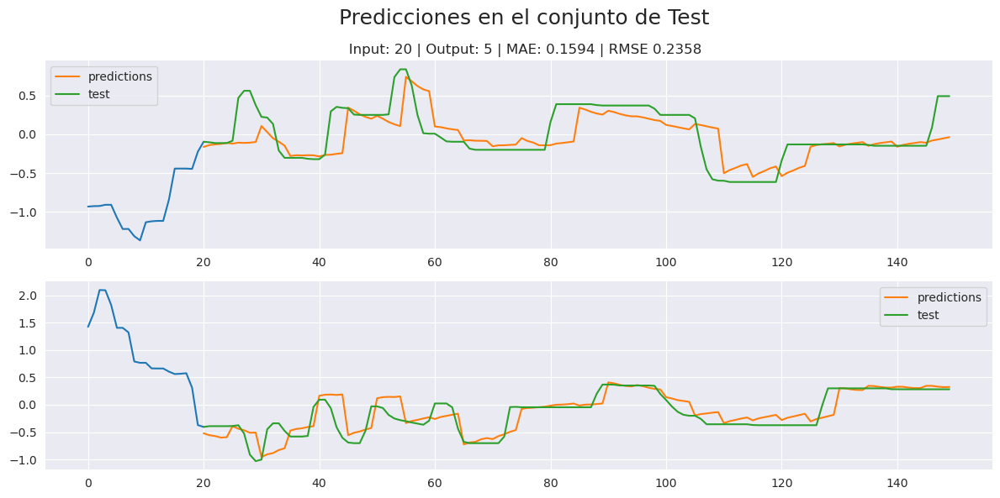

In [ ]:
INPUT_SIZE = 20
OUTPUT_SIZE = 5

plt.figure(figsize=(12,6))
plt.suptitle('       Predicciones en el conjunto de Test',fontsize=18)
plt.subplot(2, 1, 1)

plt.title(f"   Input: {str(INPUT_SIZE)} | Output: {str(OUTPUT_SIZE)} | MAE: {str(mae.round(4))} | RMSE {str(rmse.round(4))}")
res = results[1].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[:INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results.flatten()[:STAGES_LENGTH-INPUT_SIZE]), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[INPUT_SIZE:STAGES_LENGTH]["DAC"].values), label="test")
sns.set_style("darkgrid")

sns.despine()

plt.subplot(2, 1, 2)

res = results[0].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[STAGES_LENGTH:STAGES_LENGTH+INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results.flatten()[STAGES_LENGTH-INPUT_SIZE:2*STAGES_LENGTH-2*INPUT_SIZE]), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[STAGES_LENGTH+INPUT_SIZE:2*STAGES_LENGTH]["DAC"].values), label="test")

sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

plt.savefig("mov_win/inp20out5layers1units160lr001bs4epochs300.png")

## Input = 20, Output = 10

In [ ]:
INPUT_SIZE=20
OUTPUT_SIZE=10

In [ ]:
#preds_20_10 = pd.DataFrame(columns=["input_size","output_size","mae","rmse","deep_layers","lstm_units","learning_rate","batch_size","max_epochs"])
preds_20_10 = pd.read_csv("datasets/predictions_input20_output10.csv")

In [ ]:
preds_20_10.to_csv("datasets/predictions_input20_output10.csv",index=False)

In [ ]:
mae=1
while mae>0.162:
    X_train, y_train = generate_moving_windows(train_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    X_val, y_val = generate_moving_windows(val_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    X_test, y_test = generate_moving_windows(test_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    history, model = train_model(X_train, y_train, X_val, y_val, output_size=OUTPUT_SIZE, deep_layers=1, lstm_units=160, lr=0.01, bs=4, epochs=300)
    results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
    mae, rmse = get_metrics(y_test.flatten(), results.flatten())

In [ ]:
X_test, y_test = generate_moving_windows(test_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
results = best_model_20_10.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
mae, rmse = get_metrics(y_test.flatten(), results.flatten())

Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)
MAE:  0.21738966129729909
MSE:  0.08891213329490501
RMSE:  0.29818137650581905


In [ ]:
preds_20_10.sort_values(by="mae",ascending=True).head(20)

,input_size,output_size,mae,rmse,deep_layers,lstm_units,learning_rate,batch_size,max_epochs
34,20.0,10.0,0.217390,0.298181,0.0,60.0,0.010,4.0,300.0
35,20.0,10.0,0.219348,0.286466,0.0,60.0,0.005,1.0,300.0
44,20.0,10.0,0.220557,0.303228,0.0,100.0,0.010,1.0,300.0
59,20.0,10.0,0.221936,0.300048,1.0,60.0,0.005,1.0,300.0
48,20.0,10.0,0.223159,0.295144,0.0,100.0,0.005,2.0,300.0
41,20.0,10.0,0.223798,0.293900,0.0,80.0,0.005,1.0,300.0
89,20.0,10.0,0.225709,0.295083,2.0,80.0,0.005,1.0,300.0
28,20.0,10.0,0.226421,0.306120,1.0,120.0,0.010,2.0,300.0
76,20.0,10.0,0.226511,0.306352,1.0,120.0,0.010,4.0,300.0
46,20.0,10.0,0.226608,0.301573,0.0,100.0,0.010,4.0,300.0


In [ ]:
preds_20_10, best_model_20_10 = tuning(preds_20_10, train_df, val_df, test_df, input_size=INPUT_SIZE, output_size=OUTPUT_SIZE, layers=[0,1,2], lstm_units=[60,80,100,120], lr=[0.01, 0.005], bs=[1,2,4], epochs=300)

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:19:54.932048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:19:54.934514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:19:54.936798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:20:38.754460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:20:38.756735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:20:38.758945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:21:04.304876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:21:04.306740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:21:04.308734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:21:22.878235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:21:22.880400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:21:22.882163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:22:07.443131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:22:07.445870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:22:07.448153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:22:37.853849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:22:37.856528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:22:37.859080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:22:54.204423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:22:54.207221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:22:54.208747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:23:37.787380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:23:37.789322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:23:37.790854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:24:07.410329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:24:07.412235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:24:07.413829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:24:26.488559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:24:26.490226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:24:26.491625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:25:16.681079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:25:16.684567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:25:16.687227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:25:47.186262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:25:47.188790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:25:47.190463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:26:05.035515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:26:05.038744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:26:05.040740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:26:49.734486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:26:49.737236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:26:49.740196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:27:23.301010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:27:23.303409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:27:23.305015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:27:40.861017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:27:40.863253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:27:40.865655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:28:26.154126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:28:26.156853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:28:26.159204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:29:03.189465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:29:03.191642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:29:03.194195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:29:23.180168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:29:23.182491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:29:23.184398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:30:26.417980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:30:26.419478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:30:26.420686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:31:03.947186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:31:03.949331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:31:03.951780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:31:24.041959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:31:24.044830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:31:24.046934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:32:19.883045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:32:19.885808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:32:19.887930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:32:58.237386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:32:58.239489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:32:58.241936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:33:22.097319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:33:22.099300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:33:22.100745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:34:46.975232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:34:46.977523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:34:46.979343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:35:37.433033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:35:37.435006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:35:37.437104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:36:11.292566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:36:11.294346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:36:11.296003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:37:22.524839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:37:22.526941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:37:22.528965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:38:12.447353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:38:12.450103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:38:12.452676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:38:42.939656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:38:42.941447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:38:42.943207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:40:14.398891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:40:14.401641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:40:14.403904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:41:27.191103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:41:27.194372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:41:27.196491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:41:59.600790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:41:59.602869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:41:59.604518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:43:24.693212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:43:24.695868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:43:24.698314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:44:24.556803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:44:24.558648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:44:24.560046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:45:02.232618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:45:02.235471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:45:02.237741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:46:29.915151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:46:29.918144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:46:29.920905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:47:55.344131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:47:55.346520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:47:55.348088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:48:30.451279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:48:30.453232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:48:30.454856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:49:44.402164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:49:44.404149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:49:44.405694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:50:49.388368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:50:49.390834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:50:49.393257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:51:31.710618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:51:31.712459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:51:31.714243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:53:10.185894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:53:10.187949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:53:10.190109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:54:50.413284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:54:50.416084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:54:50.418304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:55:29.874062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:55:29.876929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:55:29.878834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:57:11.257614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:57:11.259944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:57:11.261872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:58:23.259373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:58:23.262227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:58:23.264593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 21:59:02.008503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 21:59:02.010522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 21:59:02.012325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:02:38.778597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:02:38.781120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:02:38.782501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:03:36.594563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:03:36.597103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:03:36.598665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:04:28.456409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:04:28.458813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:04:28.460912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:06:37.255954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:06:37.258126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:06:37.259730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:08:06.851919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:08:06.854443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:08:06.857422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:08:52.793469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:08:52.795253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:08:52.796948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:12:16.703189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:12:16.705564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:12:16.707109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:13:50.296992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:13:50.298848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:13:50.300372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:14:45.895152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:14:45.897188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:14:45.900050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:16:41.394579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:16:41.397497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:16:41.399573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:18:48.538541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:18:48.541192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:18:48.543286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:19:33.232930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:19:33.235566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:19:33.237878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:22:53.738695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:22:53.740732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:22:53.742426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:24:33.323913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:24:33.326564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:24:33.328227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:25:24.567259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:25:24.569983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:25:24.571770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:27:48.632578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:27:48.634822: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:27:48.636768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:29:22.948663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:29:22.951778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:29:22.954876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:30:18.586633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:30:18.589666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:30:18.591966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:33:36.273507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:33:36.275622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:33:36.277343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:35:26.480215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:35:26.482127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:35:26.484453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:36:15.019452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:36:15.021956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:36:15.023923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:38:10.985145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:38:10.988751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:38:10.991907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (208, 20, 4)
Dimensiones de las ventanas de salida: (208, 10, 1)
Dimensiones de las ventanas de entrada: (52, 20, 4)
Dimensiones de las ventanas de salida: (52, 10, 1)
Dimensiones de las ventanas de entrada: (26, 20, 4)
Dimensiones de las ventanas de salida: (26, 10, 1)


2023-06-08 22:40:08.277374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-08 22:40:08.279752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-08 22:40:08.281839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

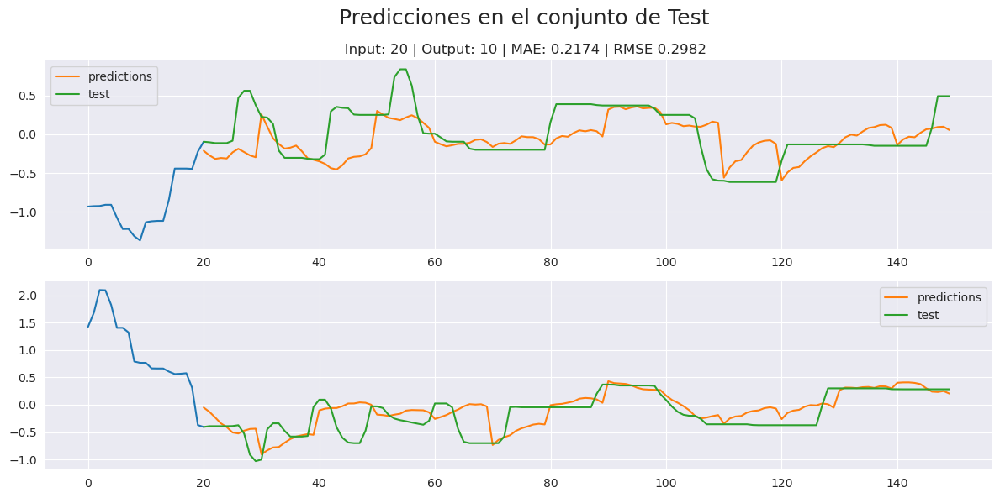

In [ ]:
plt.figure(figsize=(12,6))
plt.suptitle('       Predicciones en el conjunto de Test',fontsize=18)
plt.subplot(2, 1, 1)

plt.title(f"   Input: {str(INPUT_SIZE)} | Output: {str(OUTPUT_SIZE)} | MAE: {str(mae.round(4))} | RMSE {str(rmse.round(4))}")
res = results[1].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[:INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results.flatten()[:STAGES_LENGTH-INPUT_SIZE]), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[INPUT_SIZE:STAGES_LENGTH]["DAC"].values), label="test")
sns.set_style("darkgrid")

sns.despine()

plt.subplot(2, 1, 2)

res = results[0].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[STAGES_LENGTH:STAGES_LENGTH+INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results.flatten()[STAGES_LENGTH-INPUT_SIZE:2*STAGES_LENGTH-2*INPUT_SIZE]), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[STAGES_LENGTH+INPUT_SIZE:2*STAGES_LENGTH]["DAC"].values), label="test")

sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

#plt.savefig("mov_win/inp20out10layers0units60lr001bs4epochs300.png")

## Input = 30, Output = 15

In [58]:
INPUT_SIZE=30
OUTPUT_SIZE=15

In [67]:
#preds_30_15 = pd.DataFrame(columns=["input_size","output_size","mae","rmse","deep_layers","lstm_units","learning_rate","batch_size","max_epochs"])
preds_30_15 = pd.read_csv("datasets/predictions_input30_output15.csv")

In [66]:
preds_30_15.to_csv("datasets/predictions_input30_output15.csv",index=False)

In [61]:
mae=1
while mae>0.2395:
    X_train, y_train = generate_moving_windows(train_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    X_val, y_val = generate_moving_windows(val_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    X_test, y_test = generate_moving_windows(test_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    history, model = train_model(X_train, y_train, X_val, y_val, output_size=OUTPUT_SIZE, deep_layers=1, lstm_units=160, lr=0.01, bs=4, epochs=300)
    results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
    mae, rmse = get_metrics(y_test.flatten(), results.flatten())

Dimensiones de las ventanas de entrada: (128, 20, 4)
Dimensiones de las ventanas de salida: (128, 15, 1)
Dimensiones de las ventanas de entrada: (32, 20, 4)
Dimensiones de las ventanas de salida: (32, 15, 1)
Dimensiones de las ventanas de entrada: (16, 20, 4)
Dimensiones de las ventanas de salida: (16, 15, 1)


2023-06-09 08:55:09.902528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-09 08:55:09.905047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-09 08:55:09.906664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

KeyboardInterrupt: 

In [68]:
preds_30_15.sort_values(by="mae",ascending=True).head(20)

,input_size,output_size,mae,rmse,deep_layers,lstm_units,learning_rate,batch_size,max_epochs


In [79]:
OUTPUT_SIZE

1

In [78]:
preds_30_15, best_model_30_15 = tuning(preds_30_15, train_df, val_df, test_df, input_size=INPUT_SIZE, output_size=OUTPUT_SIZE, layers=[0,1,2], lstm_units=[40,60,80,100,120], lr=[0.01, 0.008,0.005,0.002,0.001], bs=[1,2,4], epochs=300)

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 17:41:08.435594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 17:41:08.437677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 17:41:08.440182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 17:51:11.383941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 17:51:11.385685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 17:51:11.386979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 17:55:42.974164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 17:55:42.977566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 17:55:42.979799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 17:57:49.841911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 17:57:49.844313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 17:57:49.845793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:06:21.957399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:06:21.960701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:06:21.962594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:11:43.954369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:11:43.956032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:11:43.957303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:13:56.275500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:13:56.278454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:13:56.281065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:20:31.070652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:20:31.073245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:20:31.075294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:25:00.921823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:25:00.923666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:25:00.925152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:27:16.164558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:27:16.166237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:27:16.167435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:34:21.098263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:34:21.100203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:34:21.101683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:38:22.063504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:38:22.066269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:38:22.068026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:40:38.265222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:40:38.266884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:40:38.268097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:46:52.995335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:46:52.998278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:46:52.999737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:50:53.308178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:50:53.310095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:50:53.312714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 18:52:40.395977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 18:52:40.398874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 18:52:40.400889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:00:57.290119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:00:57.292018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:00:57.293259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:06:05.714327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:06:05.715848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:06:05.717532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:08:41.817103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:08:41.820961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:08:41.824580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:16:30.624249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:16:30.627153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:16:30.629854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:21:12.265483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:21:12.267299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:21:12.268497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:23:46.419043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:23:46.421037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:23:46.422464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:32:15.600608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:32:15.602405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:32:15.603806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:36:22.436196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:36:22.438095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:36:22.439871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:39:00.454056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:39:00.455855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:39:00.457152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:47:00.646895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:47:00.648884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:47:00.650360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:52:00.028520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:52:00.030759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:52:00.032242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 19:54:20.333497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 19:54:20.335162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 19:54:20.336419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:03:03.419020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:03:03.420485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:03:03.421772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:06:56.071664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:06:56.073255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:06:56.074456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:09:10.573604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:09:10.576563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:09:10.578696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:18:50.062672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:18:50.064610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:18:50.066037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:23:47.982698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:23:47.984648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:23:47.986075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:26:34.261847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:26:34.264957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:26:34.266746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:35:35.499271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:35:35.502197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:35:35.503974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:41:20.283827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:41:20.285744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:41:20.287576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:43:52.121642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:43:52.123292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:43:52.124593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:52:09.846070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:52:09.847800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:52:09.849384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 20:58:49.686167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 20:58:49.688035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 20:58:49.689863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:01:26.717529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:01:26.720695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:01:26.723013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:09:01.711663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:09:01.713599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:09:01.715100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:14:39.985586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:14:39.987210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:14:39.988418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:17:01.379360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:17:01.381696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:17:01.383461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:24:07.338871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:24:07.342250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:24:07.344261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:28:31.532858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:28:31.536245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:28:31.538468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:30:41.073518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:30:41.075179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:30:41.076506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:45:07.036068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:45:07.039231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:45:07.043133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:51:41.576191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:51:41.578011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:51:41.580319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 21:54:46.064002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 21:54:46.065761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 21:54:46.066987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:02:48.742256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:02:48.743873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:02:48.745555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:08:07.114925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:08:07.116961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:08:07.118839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:10:45.733175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:10:45.736118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:10:45.739288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:21:16.011071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:21:16.013386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:21:16.016686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:27:25.721546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:27:25.723642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:27:25.725157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:30:35.951629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:30:35.953232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:30:35.954494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:38:52.093649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:38:52.095618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:38:52.097119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:44:30.376958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:44:30.378380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:44:30.380913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:47:24.088573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:47:24.091241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:47:24.093250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 22:56:23.945352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 22:56:23.947948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 22:56:23.949615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:01:44.210705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:01:44.213872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:01:44.216648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:04:31.974850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:04:31.976402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:04:31.977700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:15:16.808070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:15:16.810549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:15:16.812547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:21:48.075980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:21:48.077555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:21:48.078785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:24:56.492628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:24:56.495208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:24:56.497690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:37:37.361422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:37:37.363138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:37:37.364567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:42:59.316658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:42:59.318489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:42:59.320011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:46:03.709319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:46:03.711818: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:46:03.714668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-10 23:54:55.133059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 23:54:55.136515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 23:54:55.139773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:01:51.903056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:01:51.905253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:01:51.906989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:05:17.695653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:05:17.699549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:05:17.702038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:15:47.710528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:15:47.712333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:15:47.713734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:21:42.145493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:21:42.149863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:21:42.153407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:25:23.685742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:25:23.688365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:25:23.690016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:34:03.304885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:34:03.307100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:34:03.308655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:40:44.138899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:40:44.142152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:40:44.144369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:43:54.014749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:43:54.018092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:43:54.020185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 00:59:33.322128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 00:59:33.323994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 00:59:33.325719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 01:08:31.851973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 01:08:31.855107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 01:08:31.857355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 01:12:24.860094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 01:12:24.861983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 01:12:24.863507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 01:25:32.141324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 01:25:32.143335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 01:25:32.144901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 01:32:45.067980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 01:32:45.070158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 01:32:45.071411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 01:37:22.169930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 01:37:22.182205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 01:37:22.184838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 01:50:58.883552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 01:50:58.885479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 01:50:58.887190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 01:59:59.310423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 01:59:59.312976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 01:59:59.315645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 02:04:29.186286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 02:04:29.189578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 02:04:29.193781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 02:20:11.678172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 02:20:11.679834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 02:20:11.681108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 02:28:45.731525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 02:28:45.733279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 02:28:45.734606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 02:32:30.914435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 02:32:30.916780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 02:32:30.918711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 02:46:09.154349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 02:46:09.158729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 02:46:09.162101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 02:53:48.471337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 02:53:48.473196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 02:53:48.474917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 02:58:01.961346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 02:58:01.963274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 02:58:01.964926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 03:13:49.363915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 03:13:49.368607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 03:13:49.371624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 03:24:55.603080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 03:24:55.606226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 03:24:55.608463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 03:30:43.699502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 03:30:43.701785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 03:30:43.703253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 03:47:48.370899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 03:47:48.372846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 03:47:48.374741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 03:57:35.563647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 03:57:35.567565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 03:57:35.570705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 04:02:47.002871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 04:02:47.005373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 04:02:47.006872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 04:18:44.807426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 04:18:44.809522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 04:18:44.811944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 04:28:08.143978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 04:28:08.146963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 04:28:08.148684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 04:34:05.215957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 04:34:05.219420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 04:34:05.223538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 04:50:00.507070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 04:50:00.509274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 04:50:00.510576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 04:59:19.497635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 04:59:19.501156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 04:59:19.502985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 05:04:13.964088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 05:04:13.967404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 05:04:13.970075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 05:16:27.372500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 05:16:27.374838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 05:16:27.376666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 05:24:33.468685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 05:24:33.471580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 05:24:33.474530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 05:28:51.557381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 05:28:51.558851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 05:28:51.560116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 05:39:00.077020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 05:39:00.079639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 05:39:00.083278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 05:49:11.205260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 05:49:11.208714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 05:49:11.210873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 05:54:18.963540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 05:54:18.965913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 05:54:18.967343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 06:05:09.170570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 06:05:09.174546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 06:05:09.177449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 06:15:19.077394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 06:15:19.082390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 06:15:19.085343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 06:20:23.580291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 06:20:23.583170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 06:20:23.585229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 06:33:38.430216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 06:33:38.433006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 06:33:38.434987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 06:44:12.992858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 06:44:12.994493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 06:44:12.996146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 06:49:51.585294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 06:49:51.587701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 06:49:51.589311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 07:06:53.720128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 07:06:53.722219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 07:06:53.724144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 07:17:19.739767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 07:17:19.743056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 07:17:19.745537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 07:23:19.763740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 07:23:19.767166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 07:23:19.769290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 07:42:53.742099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 07:42:53.744338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 07:42:53.746643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 07:52:08.087120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 07:52:08.090667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 07:52:08.092984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 07:57:14.690168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 07:57:14.695087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 07:57:14.699968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 08:10:49.803517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 08:10:49.805386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 08:10:49.806910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 08:22:00.469482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 08:22:00.471606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 08:22:00.473206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 08:28:23.471553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 08:28:23.474026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 08:28:23.476287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 08:44:53.101006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 08:44:53.103580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 08:44:53.105857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 08:57:20.846235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 08:57:20.848437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 08:57:20.849857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 09:03:51.522302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 09:03:51.524277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 09:03:51.526330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 09:22:06.095305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 09:22:06.098059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 09:22:06.100011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 09:35:29.598029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 09:35:29.600103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 09:35:29.601650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 09:41:50.750910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 09:41:50.753005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 09:41:50.754632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 09:58:15.465382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 09:58:15.468965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 09:58:15.471330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 10:11:19.583112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 10:11:19.586783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 10:11:19.589598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 10:17:22.936290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 10:17:22.938576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 10:17:22.940980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 10:39:20.913573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 10:39:20.915537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 10:39:20.917359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 11:02:08.876226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 11:02:08.879619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 11:02:08.883434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 11:07:43.799488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 11:07:43.801131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 11:07:43.802421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 11:39:20.339758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 11:39:20.342591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 11:39:20.344300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 11:55:41.477115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 11:55:41.480483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 11:55:41.482344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 12:02:51.534020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 12:02:51.536176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 12:02:51.538549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 12:22:20.344815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 12:22:20.347201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 12:22:20.348780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 12:40:30.925044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 12:40:30.927274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 12:40:30.928922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 12:46:37.156191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 12:46:37.167054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 12:46:37.171112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 13:07:37.176690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 13:07:37.178953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 13:07:37.180900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 13:21:00.239337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 13:21:00.241473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 13:21:00.243132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 13:28:47.373360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 13:28:47.376947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 13:28:47.378876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 13:52:30.589086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 13:52:30.595039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 13:52:30.599991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 14:08:03.108636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 14:08:03.110866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 14:08:03.112456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 14:16:01.019219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 14:16:01.021295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 14:16:01.023446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 14:38:01.423635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 14:38:01.428277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 14:38:01.433405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 14:48:43.898724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 14:48:43.900604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 14:48:43.902076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 14:55:06.481328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 14:55:06.482906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 14:55:06.484105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 15:10:52.127372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 15:10:52.129890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 15:10:52.131329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 15:26:00.596722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 15:26:00.616614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 15:26:00.620293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 15:31:50.920793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 15:31:50.925804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 15:31:50.928804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 15:59:35.374799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 15:59:35.376709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 15:59:35.378144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 16:13:31.877316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 16:13:31.879564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 16:13:31.881132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 16:20:26.990615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 16:20:26.992553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 16:20:26.994172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 16:41:28.573628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 16:41:28.575585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 16:41:28.576922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 16:53:45.410146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 16:53:45.412749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 16:53:45.415406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 17:00:01.067225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 17:00:01.071360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 17:00:01.073994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 17:27:49.781799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 17:27:49.783730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 17:27:49.785203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 17:45:48.220963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 17:45:48.223101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 17:45:48.226009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 17:51:09.444295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 17:51:09.446643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 17:51:09.448086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 18:23:24.651174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 18:23:24.653911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 18:23:24.655838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 18:34:52.046594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 18:34:52.051632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 18:34:52.054730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 18:40:55.050661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 18:40:55.056486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 18:40:55.062448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 19:03:26.298989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 19:03:26.304405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 19:03:26.309011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 19:20:34.311888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 19:20:34.316818: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 19:20:34.322518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 19:32:23.162128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 19:32:23.164145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 19:32:23.165763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 20:05:28.151300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 20:05:28.156430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 20:05:28.159948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 20:23:37.476653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 20:23:37.480173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 20:23:37.482839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 20:32:35.664153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 20:32:35.667268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 20:32:35.671709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 21:03:09.349589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 21:03:09.354386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 21:03:09.360245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 21:23:04.699960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 21:23:04.705811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 21:23:04.711130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 21:35:23.581793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 21:35:23.586495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 21:35:23.589812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 22:01:03.641905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 22:01:03.644316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 22:01:03.646657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 22:16:36.854688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 22:16:36.857586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 22:16:36.860047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 22:26:13.770941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 22:26:13.773065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 22:26:13.776264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 22:56:34.253618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 22:56:34.256036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 22:56:34.258088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 23:14:34.052230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 23:14:34.053958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 23:14:34.055283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 23:21:22.935089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 23:21:22.938974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 23:21:22.943048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-11 23:51:51.855852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-11 23:51:51.859145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-11 23:51:51.862044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 00:20:17.694768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 00:20:17.699568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 00:20:17.704119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 00:27:21.591434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 00:27:21.594293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 00:27:21.596336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 01:00:58.594254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 01:00:58.597913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 01:00:58.600477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 01:25:52.311793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 01:25:52.314105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 01:25:52.316815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 01:33:43.726485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 01:33:43.729228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 01:33:43.731321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 02:02:22.443234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 02:02:22.446824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 02:02:22.449567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 02:23:37.670024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 02:23:37.672170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 02:23:37.674124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 02:33:36.567187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 02:33:36.569686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 02:33:36.571896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 03:02:03.676728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 03:02:03.678687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 03:02:03.680234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 03:21:24.825399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 03:21:24.829516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 03:21:24.832426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 03:28:58.189085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 03:28:58.191782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 03:28:58.193972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 03:54:31.003014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 03:54:31.007385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 03:54:31.010412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 04:11:10.142607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 04:11:10.144765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 04:11:10.146539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 04:17:46.758575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 04:17:46.760900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 04:17:46.762576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 04:59:28.350048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 04:59:28.353693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 04:59:28.356304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 05:22:10.767033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 05:22:10.769349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 05:22:10.771625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 05:37:25.898790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 05:37:25.902625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 05:37:25.905617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 06:31:11.452349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 06:31:11.454830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 06:31:11.457255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 07:01:59.079666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 07:01:59.081585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 07:01:59.082860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 07:16:28.943398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 07:16:28.945611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 07:16:28.947053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 07:49:01.834539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 07:49:01.836613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 07:49:01.839142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 08:13:26.283553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 08:13:26.287527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 08:13:26.290865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 08:21:50.256578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 08:21:50.258474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 08:21:50.259806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 08:54:09.600283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 08:54:09.603204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 08:54:09.605884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 09:14:30.162507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 09:14:30.164507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 09:14:30.166223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 09:25:16.415104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 09:25:16.416581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 09:25:16.417751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 09:47:33.491613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 09:47:33.495460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 09:47:33.500163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 10:04:06.818283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 10:04:06.822148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 10:04:06.825060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 10:11:53.019158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 10:11:53.022645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 10:11:53.026396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 10:51:55.553821: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 10:51:55.557432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 10:51:55.560309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 11:10:49.327102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 11:10:49.329645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 11:10:49.331247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (2080, 20, 4)
Dimensiones de las ventanas de salida: (2080, 1, 1)
Dimensiones de las ventanas de entrada: (520, 20, 4)
Dimensiones de las ventanas de salida: (520, 1, 1)
Dimensiones de las ventanas de entrada: (260, 20, 4)
Dimensiones de las ventanas de salida: (260, 1, 1)


2023-06-12 11:22:59.481139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-12 11:22:59.483565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-12 11:22:59.485532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

KeyboardInterrupt: 

In [59]:
X_test, y_test = generate_moving_windows(test_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
results = best_model_30_15.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
mae, rmse = get_metrics(y_test.flatten(), results.flatten())

Dimensiones de las ventanas de entrada: (16, 20, 4)
Dimensiones de las ventanas de salida: (16, 15, 1)
MAE:  0.23922991936153476
MSE:  0.09403593078494632
RMSE:  0.3066527853859252


ValueError: array length 130 does not match index length 110

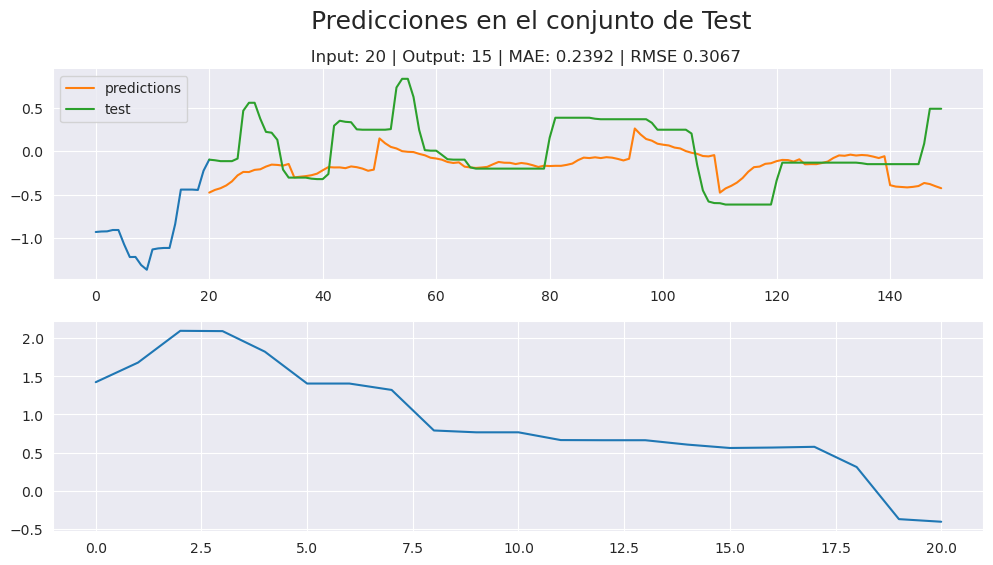

In [55]:
plt.figure(figsize=(12,6))
plt.suptitle('       Predicciones en el conjunto de Test',fontsize=18)
plt.subplot(2, 1, 1)

plt.title(f"   Input: {str(INPUT_SIZE)} | Output: {str(OUTPUT_SIZE)} | MAE: {str(mae.round(4))} | RMSE {str(rmse.round(4))}")
res = results[1].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[:INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results.flatten()[:STAGES_LENGTH-INPUT_SIZE]), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[INPUT_SIZE:STAGES_LENGTH]["DAC"].values), label="test")
sns.set_style("darkgrid")

sns.despine()

plt.subplot(2, 1, 2)

res = results[0].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[STAGES_LENGTH:STAGES_LENGTH+INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results.flatten()[STAGES_LENGTH-INPUT_SIZE:2*STAGES_LENGTH-2*INPUT_SIZE]), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[STAGES_LENGTH+INPUT_SIZE:2*STAGES_LENGTH]["DAC"].values), label="test")

sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

#plt.savefig("mov_win/inp20out5layers1units160lr001bs4epochs300.png")

## Input = 30, Output = 20

In [19]:
INPUT_SIZE=30
OUTPUT_SIZE=20

In [20]:
#preds_30_20 = pd.DataFrame(columns=["input_size","output_size","mae","rmse","deep_layers","lstm_units","learning_rate","batch_size","max_epochs"])
preds_30_20 = pd.read_csv("datasets/predictions_input30_output20.csv")

In [25]:
preds_30_20.to_csv("datasets/predictions_input30_output20.csv",index=False)

In [ ]:
mae=1
while mae>0.162:
    X_train, y_train = generate_moving_windows(train_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    X_val, y_val = generate_moving_windows(val_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    X_test, y_test = generate_moving_windows(test_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
    history, model = train_model(X_train, y_train, X_val, y_val, output_size=OUTPUT_SIZE, deep_layers=1, lstm_units=160, lr=0.01, bs=4, epochs=300)
    results = model.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
    mae, rmse = get_metrics(y_test.flatten(), results.flatten())

In [22]:
preds_30_20.sort_values(by="mae",ascending=True).head(20)

,input_size,output_size,mae,rmse,deep_layers,lstm_units,learning_rate,batch_size,max_epochs
39,30.0,20.0,0.215938,0.274751,0.0,80.0,0.002,1.0,300.0
61,30.0,20.0,0.218511,0.286518,0.0,120.0,0.010,2.0,300.0
35,30.0,20.0,0.221025,0.293526,0.0,80.0,0.008,4.0,300.0
219,30.0,20.0,0.221885,0.287422,2.0,120.0,0.002,1.0,300.0
94,30.0,20.0,0.223120,0.284850,1.0,60.0,0.008,2.0,300.0
33,30.0,20.0,0.224340,0.301078,0.0,80.0,0.008,1.0,300.0
20,30.0,20.0,0.224624,0.289166,0.0,60.0,0.008,4.0,300.0
137,30.0,20.0,0.225277,0.300924,1.0,120.0,0.010,4.0,300.0
112,30.0,20.0,0.226196,0.289832,1.0,80.0,0.005,2.0,300.0
95,30.0,20.0,0.226561,0.289035,1.0,60.0,0.008,4.0,300.0


In [21]:
preds_30_20, best_model_30_20 = tuning(preds_30_20, train_df, val_df, test_df, input_size=INPUT_SIZE, output_size=OUTPUT_SIZE, layers=[0,1,2], lstm_units=[40,60,80,100,120], lr=[0.01, 0.008,0.005,0.002,0.001], bs=[1,2,4], epochs=300)

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:16:06.199162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:16:06.203604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:16:06.206901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:16:44.547361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:16:44.549618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:16:44.551161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:17:03.750172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:17:03.752962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:17:03.754507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:17:14.486990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:17:14.489565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:17:14.491035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:17:40.233197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:17:40.235206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:17:40.237777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

2023-06-10 12:17:55.754123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:17:55.757345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:17:55.759799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:17:56.355538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:17:56.359226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:17:56.361480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

2023-06-10 12:18:06.624472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:18:06.627600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:18:06.630029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:18:07.204687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:18:07.206632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:18:07.209081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:18:31.388360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:18:31.390799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:18:31.392416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:18:49.482777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:18:49.485975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:18:49.488625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:19:00.515736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:19:00.517561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:19:00.519072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:19:44.926745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:19:44.930868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:19:44.934527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:20:09.295014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:20:09.297969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:20:09.299657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:20:24.331284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:20:24.333601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:20:24.335385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:20:50.498317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:20:50.501876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:20:50.505733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:21:12.058584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:21:12.060435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:21:12.062272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:21:25.887926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:21:25.890451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:21:25.892980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:21:54.579469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:21:54.582477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:21:54.584247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:22:14.251482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:22:14.254667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:22:14.256638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:22:27.894852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:22:27.896453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:22:27.897701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:22:56.611872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:22:56.614504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:22:56.616146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:23:17.888690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:23:17.892195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:23:17.896188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:23:36.094451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:23:36.097539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:23:36.101331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:24:13.896412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:24:13.899737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:24:13.902672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:24:35.954745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:24:35.956512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:24:35.957843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:24:49.098104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:24:49.101710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:24:49.104068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:25:26.350797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:25:26.353277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:25:26.355879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:25:53.273096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:25:53.276244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:25:53.278498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:26:09.170352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:26:09.173296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:26:09.175495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:26:37.636599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:26:37.638608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:26:37.640283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:27:01.265047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:27:01.267292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:27:01.269030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:27:16.045031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:27:16.047915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:27:16.050588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:27:45.552255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:27:45.554577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:27:45.556091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:28:06.373314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:28:06.375628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:28:06.377377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:28:23.208862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:28:23.211877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:28:23.214155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:29:01.342135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:29:01.345126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:29:01.347851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:29:27.856867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:29:27.861702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:29:27.863864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:29:43.836970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:29:43.839238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:29:43.841416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:30:18.991374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:30:18.994638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:30:18.996962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:30:43.044718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:30:43.046782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:30:43.048405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:30:55.789539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:30:55.793009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:30:55.795412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:31:27.055446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:31:27.057904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:31:27.060902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:31:57.268309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:31:57.270283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:31:57.271886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:32:11.042893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:32:11.046097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:32:11.048707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:32:42.257484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:32:42.259406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:32:42.261088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:33:05.108224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:33:05.110655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:33:05.112142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:33:18.565422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:33:18.569008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:33:18.571175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:33:58.114098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:33:58.116028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:33:58.117495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:34:18.971568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:34:18.973887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:34:18.976430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:34:34.223220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:34:34.226615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:34:34.228839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:35:03.889870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:35:03.894157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:35:03.896709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:35:24.822650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:35:24.826019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:35:24.828021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:35:37.635977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:35:37.637958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:35:37.639717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:36:06.930118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:36:06.932083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:36:06.933648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:36:29.743891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:36:29.746103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:36:29.748956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:36:42.561436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:36:42.563527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:36:42.565167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:37:11.549104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:37:11.551355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:37:11.552769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:37:34.937427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:37:34.940389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:37:34.942227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:37:49.438995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:37:49.441349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:37:49.442758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:38:21.391761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:38:21.394108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:38:21.395609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:38:45.441217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:38:45.443380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:38:45.445171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:39:00.061430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:39:00.063692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:39:00.065780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:39:35.353987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:39:35.356305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:39:35.357818: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:40:12.491650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:40:12.493720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:40:12.495287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:40:29.645333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:40:29.647181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:40:29.648838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:41:02.231307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:41:02.233607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:41:02.235249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:41:34.768302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:41:34.770706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:41:34.772253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:41:49.351207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:41:49.353830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:41:49.355648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:42:28.267579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:42:28.270533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:42:28.272746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:42:58.427813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:42:58.429582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:42:58.431694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:43:14.495000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:43:14.496737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:43:14.498017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:43:47.816131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:43:47.818270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:43:47.820104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:44:13.416982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:44:13.419191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:44:13.420971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:44:31.614103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:44:31.616191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:44:31.619303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:45:09.963595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:45:09.966378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:45:09.968121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:45:36.382321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:45:36.385018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:45:36.387117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:45:55.296998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:45:55.298821: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:45:55.301425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:46:41.165592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:46:41.167956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:46:41.169722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:47:11.136005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:47:11.139057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:47:11.141093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:47:29.678246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:47:29.680191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:47:29.681793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:48:32.175642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:48:32.177810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:48:32.180847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:49:06.765909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:49:06.768863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:49:06.771686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:49:30.043735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:49:30.046617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:49:30.048431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:50:28.282956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:50:28.286307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:50:28.288281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:51:07.105353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:51:07.107398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:51:07.108808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:51:29.332310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:51:29.336006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:51:29.338825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:52:33.478135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:52:33.480195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:52:33.481804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:53:02.822907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:53:02.826146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:53:02.829001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:53:25.541676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:53:25.543487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:53:25.544958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:54:31.306247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:54:31.308322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:54:31.309900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:55:07.556578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:55:07.559440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:55:07.561806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:55:31.250499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:55:31.252497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:55:31.253984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:56:26.043614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:56:26.045681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:56:26.047282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:57:18.954984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:57:18.957488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:57:18.959080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:57:39.715841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:57:39.718277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:57:39.720884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:58:33.926762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:58:33.929222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:58:33.932076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:59:08.134194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:59:08.136168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:59:08.139984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 12:59:32.025748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 12:59:32.028293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 12:59:32.030614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:00:20.987984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:00:20.990610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:00:20.993024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:00:59.836985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:00:59.838947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:00:59.840460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:01:23.798571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:01:23.801240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:01:23.803190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:02:17.738727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:02:17.741512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:02:17.745656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:02:50.774218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:02:50.776511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:02:50.778899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:03:12.772858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:03:12.775336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:03:12.777630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:04:13.342844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:04:13.345263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:04:13.348695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:04:59.258687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:04:59.262448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:04:59.265017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:05:29.649651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:05:29.655281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:05:29.658834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:07:46.395804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:07:46.400006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:07:46.402720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:09:11.358327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:09:11.360780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:09:11.363718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:09:41.314381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:09:41.316401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:09:41.318581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:10:55.044253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:10:55.046806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:10:55.048353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:11:32.881111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:11:32.884444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:11:32.886980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:11:56.415365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:11:56.417248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:11:56.418581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:12:56.208452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:12:56.227216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:12:56.229664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:13:33.310061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:13:33.312893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:13:33.315313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:13:58.800779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:13:58.804436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:13:58.806479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:14:59.786524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:14:59.789493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:14:59.791304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:15:36.444993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:15:36.447580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:15:36.449377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:15:59.941606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:15:59.944069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:15:59.946313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:16:58.751516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:16:58.753575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:16:58.755055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:17:39.544609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:17:39.546627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:17:39.548336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:18:06.673943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:18:06.678087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:18:06.680986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:20:33.484363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:20:33.486185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:20:33.487763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:21:12.031140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:21:12.033569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:21:12.036654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:21:40.314019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:21:40.316044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:21:40.317567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:22:38.258696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:22:38.260720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:22:38.262431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:23:24.066334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:23:24.068997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:23:24.071202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:23:49.964042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:23:49.965966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:23:49.968140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:24:51.656065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:24:51.657996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:24:51.659471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:25:38.572658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:25:38.576845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:25:38.579370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:26:04.799537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:26:04.802416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:26:04.804065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:27:06.300882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:27:06.303291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:27:06.305301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:28:01.609902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:28:01.612263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:28:01.614017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:28:34.413717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:28:34.416355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:28:34.418402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:29:37.296924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:29:37.298888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:29:37.300420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:30:23.995728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:30:23.997541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:30:23.999078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:30:53.109217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:30:53.112087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:30:53.113904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:31:44.754419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:31:44.756468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:31:44.758224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:32:35.557421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:32:35.559182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:32:35.561267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:33:06.179652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:33:06.181444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:33:06.183141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:34:27.081124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:34:27.083662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:34:27.086252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:35:24.806495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:35:24.808409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:35:24.810200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:35:55.638796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:35:55.641534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:35:55.643675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:37:32.048586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:37:32.050425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:37:32.051942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:38:23.316737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:38:23.320872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:38:23.323957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:39:02.497639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:39:02.499862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:39:02.501433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:40:15.307964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:40:15.310471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:40:15.312120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:41:18.447436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:41:18.449313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:41:18.452759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:41:53.416383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:41:53.419012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:41:53.420936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:42:57.433194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:42:57.435325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:42:57.437529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:43:57.450663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:43:57.453845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:43:57.455793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:44:33.323461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:44:33.326142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:44:33.327853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:45:39.435252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:45:39.437187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:45:39.439615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:46:26.980067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:46:26.981977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:46:26.983494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:46:57.907142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:46:57.909023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:46:57.911447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:48:15.360147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:48:15.362805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:48:15.366804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:49:14.735997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:49:14.738683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:49:14.740539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:49:51.484188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:49:51.486348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:49:51.487926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:51:15.288100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:51:15.289995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:51:15.291408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:51:57.683051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:51:57.684964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:51:57.686980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:52:32.858533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:52:32.860378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:52:32.863242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:54:04.138412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:54:04.140875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:54:04.142507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:54:52.251728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:54:52.254949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:54:52.257034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:55:21.326432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:55:21.328671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:55:21.330271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:56:35.984199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:56:35.986860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:56:35.989305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:57:25.080226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:57:25.083821: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:57:25.086403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:58:00.086346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:58:00.089930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:58:00.093395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:59:07.808610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:59:07.811195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:59:07.812895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 13:59:56.615591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 13:59:56.618596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 13:59:56.620985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:00:25.854120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:00:25.857713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:00:25.859957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:01:29.878521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:01:29.880349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:01:29.881927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:02:11.423755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:02:11.425939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:02:11.427529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:02:44.992149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:02:44.994160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:02:44.995740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:04:16.003320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:04:16.005551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:04:16.008476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:05:29.597117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:05:29.599340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:05:29.600885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:06:11.757317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:06:11.759468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:06:11.761473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:07:55.894439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:07:55.897073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:07:55.898709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:09:04.142292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:09:04.144733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:09:04.146584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:09:42.379661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:09:42.382653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:09:42.384772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:10:54.981197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:10:54.983720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:10:54.985972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:11:54.809305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:11:54.812405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:11:54.814523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:12:25.628137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:12:25.631679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:12:25.633901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:13:44.943372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:13:44.945540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:13:44.948345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:14:52.158179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:14:52.160433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:14:52.163297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:15:30.931656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:15:30.933635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:15:30.935387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:17:31.609080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:17:31.611431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:17:31.614082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:18:31.752162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:18:31.754400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:18:31.756024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:19:18.107827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:19:18.109912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:19:18.111756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:20:31.489096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:20:31.491625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:20:31.493205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:21:42.627722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:21:42.629575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:21:42.631810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:22:30.387949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:22:30.389848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:22:30.391937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:24:10.572432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:24:10.574426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:24:10.575922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:25:10.293729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:25:10.297176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:25:10.299457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:25:47.171287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:25:47.173855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:25:47.176108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:27:20.644857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:27:20.646837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:27:20.648292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:28:20.394440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:28:20.396782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:28:20.398256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:28:57.235168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:28:57.237083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:28:57.238752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:30:24.435983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:30:24.438008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:30:24.439625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:34:02.400834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:34:02.402740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:34:02.404155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:34:53.662939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:34:53.664849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:34:53.666740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:37:39.187474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:37:39.189697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:37:39.191954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:38:36.588526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:38:36.591253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:38:36.593284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:39:16.986325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:39:16.988200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:39:16.990629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:40:47.710963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:40:47.714049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:40:47.716165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:41:47.929236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:41:47.931732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:41:47.933356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:42:33.194518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:42:33.196293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:42:33.198714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:44:47.131104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:44:47.133666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:44:47.135158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:45:50.381818: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:45:50.383909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:45:50.385430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:46:29.309481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:46:29.311636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:46:29.313527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:48:14.022971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:48:14.026292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:48:14.028282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:49:36.340905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:49:36.343831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:49:36.345722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:50:19.801240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:50:19.804287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:50:19.805993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:51:59.339051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:51:59.341050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:51:59.342534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:53:04.540326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:53:04.542739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:53:04.544467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:53:40.157649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:53:40.159500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:53:40.161058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:55:51.484084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:55:51.487324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:55:51.490038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:56:49.967347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:56:49.969853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:56:49.972075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:57:24.414803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:57:24.417351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:57:24.419022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:58:37.224472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:58:37.226624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:58:37.228189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 14:59:38.644852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 14:59:38.646838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 14:59:38.649488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 15:00:32.974792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 15:00:32.976895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 15:00:32.979451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 15:02:29.164979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 15:02:29.167537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 15:02:29.169672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 15:03:42.839248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 15:03:42.841021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 15:03:42.842374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 15:04:32.920325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 15:04:32.922270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 15:04:32.924022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 15:06:20.831316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 15:06:20.833318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 15:06:20.835861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Dimensiones de las ventanas de entrada: (96, 30, 4)
Dimensiones de las ventanas de salida: (96, 20, 1)
Dimensiones de las ventanas de entrada: (24, 30, 4)
Dimensiones de las ventanas de salida: (24, 20, 1)
Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 15:07:39.197275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 15:07:39.199505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 15:07:39.201125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [23]:
X_test, y_test = generate_moving_windows(test_df, "DAC",STAGES_LENGTH,INPUT_SIZE,OUTPUT_SIZE)
results = best_model_30_20.predict(X_test, verbose=0).reshape(y_test.shape[0],y_test.shape[1],1)
mae, rmse = get_metrics(y_test.flatten(), results.flatten())

Dimensiones de las ventanas de entrada: (12, 30, 4)
Dimensiones de las ventanas de salida: (12, 20, 1)


2023-06-10 16:44:07.505172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-10 16:44:07.508607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-10 16:44:07.510970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

MAE:  0.21593775641657503
MSE:  0.07548830768409097
RMSE:  0.2747513561096487


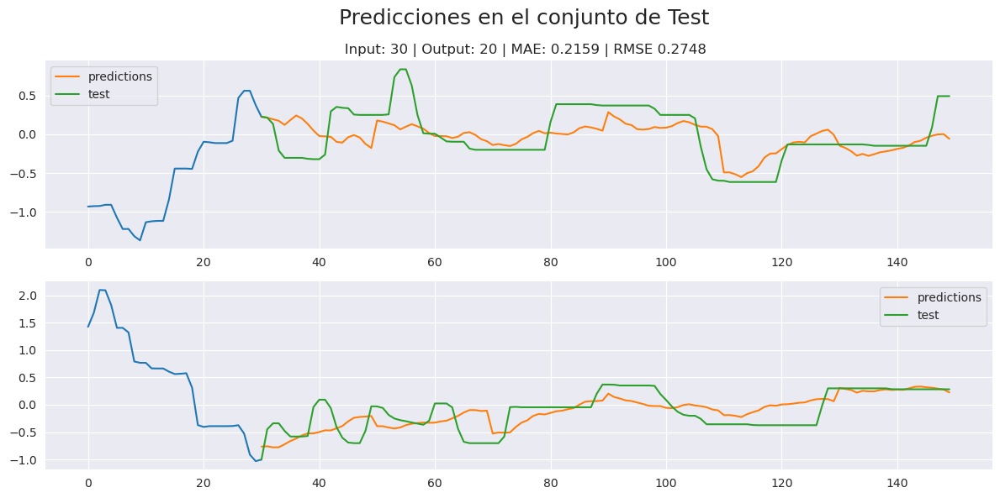

In [29]:
plt.figure(figsize=(12,6))
plt.suptitle('       Predicciones en el conjunto de Test',fontsize=18)
plt.subplot(2, 1, 1)

plt.title(f"   Input: {str(INPUT_SIZE)} | Output: {str(OUTPUT_SIZE)} | MAE: {str(mae.round(4))} | RMSE {str(rmse.round(4))}")
res = results[1].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[:INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results.flatten()[:STAGES_LENGTH-INPUT_SIZE]), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[INPUT_SIZE:STAGES_LENGTH]["DAC"].values), label="test")
sns.set_style("darkgrid")

sns.despine()

plt.subplot(2, 1, 2)

res = results[0].reshape(results.shape[1])
sns.lineplot(x=range(0,INPUT_SIZE+1),y=pd.Series(test_df[STAGES_LENGTH:STAGES_LENGTH+INPUT_SIZE+1]["DAC"].values))
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH), y=pd.Series(results.flatten()[STAGES_LENGTH-INPUT_SIZE:2*STAGES_LENGTH-2*INPUT_SIZE]), label="predictions")
sns.lineplot(x=range(INPUT_SIZE,STAGES_LENGTH),y=pd.Series(test_df[STAGES_LENGTH+INPUT_SIZE:2*STAGES_LENGTH]["DAC"].values), label="test")

sns.set_style("darkgrid")

sns.despine()

plt.tight_layout()

#plt.savefig("mov_win/inp30out20layers0units80lr0002bs1epochs300.png")

## Input = 30, Output = 30

## Save Models

In [ ]:
model = tf.keras.models.load_model(f"./models/{NAME}.h5")

2022-07-20 12:10:02.916739: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-07-20 12:10:02.916781: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-07-20 12:10:02.916806: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (danielcardenas-orolia): /proc/driver/nvidia/version does not exist
2022-07-20 12:10:02.917103: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [76]:
input_size=20
output_size=1
deep_layers=0
lstm_units=160
learning_rate=0.01
batch_size=1
max_epochs=300
model_mae=mae.round(4)
model_rmse=rmse.round(4)
NAME = f"model_input{input_size}_output{output_size}_deeplayers{deep_layers}_lstm{lstm_units}_lr{learning_rate}_batchsize{batch_size}_maxepochs{max_epochs}"

In [18]:
best_model_20_15.save(f"./models/pred2015porsiacaso.h5")

In [77]:
best_model_20_1.save(f"./models/{NAME}.h5")